### Electrophysiology mini project

Synchronized neural oscillations are critical for normal brain function. In **Parkinson’s disease (PD)** models, exaggerated neuronal synchronization of beta oscillations has been observed after loss of dopaminergic neurons in deep sub-cortical nuclei called the basal ganglia. One of these nuclei, **the globus pallidus (GP)**, might be responsible for this abnormal synchronization and can be regarded as a promising therapeutic target.

In this project, you will **analyse electrophysiological recordings from a rat model of PD**.

The goal of the project is to characterize the **synchrony between the cortical EEG and the neuronal activity** of neurons of the GB. The neuronal activity and EEG of **healthy and PD model rats** have been recorded in **two different anaesthesia states: the slow-wave and activated state**, which differ in the brain oscillations expressed.

To highlight the synchrony between neuronal firing and EEG, you will rely on *coherence analysis* of the various recorded neurons in the GP and the cortical EEG. You will also show that GP neurons display *heterogeneity in their firing patterns* and *synchrony to EEG* in the slow-wave and activated states.

The project will reproduce partially the results shown in Fig. 1 of this paper: \
Mallet, N., Micklem, B. R., Henny, P., Brown, M. T., Williams, C., Bolam, J. P., Nakamura, K. C., & Magill, P. J. (2012). Dichotomous organization of the external globus pallidus. *Neuron*, 74(6), 1075–1086. \
https://doi.org/10.1016/j.neuron.2012.04.027



# Strucutre of the notebook
## PART 1: Filling  of the nootebook as it was asked + comment about what we did
## PART 2: Use of the tool used in part 1 to answer to some certain questions and to make figures for the report 
###        Question 1) Is there a difference between frequency composition of EEG of Parkinsonian or control group (in slow wave and active state) ?
###        Question 2) Are there some synchronized GPe neurons during parkinsonian active state ? Are they synchronised with EEG at beta frequency?
###        Question 3) Can we classify neurons based on their tendency to fire at specific phases of the EEG cycle during SWA (in parkinsonian and control)?

# PART 1

In [3]:
# We import all needed libraries
import numpy as np 
import scipy
import scipy.signal
import h5py
import matplotlib.pyplot as plt

In [4]:
# Load the data in a dictionnary
data={'ActivPark': h5py.File('./L23_f09_as_PARK.mat','r'),
      'SWAPark': h5py.File('./L23_f03_swa_PARK.mat','r'),
      'ActivCtl': h5py.File('./A9_c05_as_CTL.mat','r'),
      'SWACtl': h5py.File('./A9_c01_swa_CTL.mat','r')}

# Look at the variable names in each data file
for key, value in data.items():
    print(key)
    print(data[key].keys())

ActivPark
<KeysViewHDF5 ['L23_Beat_cycl', 'L23_Beta_EEG', 'L23_EEGipsi', 'L23_Pr18_c08', 'L23_Pr20_c09', 'L23_Pr20_c0A', 'L23_Pr20_c0B', 'L23_Pr23_c0E', 'L23_Pr25_c10', 'L23_Pr25_c11', 'L23_Pr26_c12', 'L23_SS_Pr_1', 'L23_SS_Pr_11', 'L23_SS_Pr_17', 'L23_SS_Pr_21', 'L23_SS_Pr_22', 'L23_SS_Pr_3', 'L23_SS_Pr_7', 'L23_SS_Pr_9']>
SWAPark
<KeysViewHDF5 ['L23_EEGipsi', 'L23_Pr20_c09', 'L23_Pr20_c0A', 'L23_Pr20_c0B', 'L23_Pr23_c0E', 'L23_Pr23_c0F', 'L23_Pr25_c10', 'L23_Pr25_c11', 'L23_SS_Pr_1', 'L23_SS_Pr_11', 'L23_SS_Pr_17', 'L23_SS_Pr_21', 'L23_SS_Pr_22', 'L23_SS_Pr_7']>
ActivCtl
<KeysViewHDF5 ['A9_EEGipsi', 'A9_P2021_c10', 'A9_P2021_c11', 'A9_Pr10_c0C', 'A9_Pr10_c0D', 'A9_Pr10_c0E', 'A9_Pr17_c01', 'A9_Pr17_c10', 'A9_Pr1_c01', 'A9_Pr22_c12', 'A9_Pr22_c13', 'A9_Pr2_c02', 'A9_Pr2_c1B', 'A9_Pr6_c05', 'A9_Pr8_c07', 'A9_Pr8_c08', 'A9_SS_Pr_25', 'A9_SS_Pr_3', 'A9_SS_Pr_4', 'A9_SS_Pr_9']>
SWACtl
<KeysViewHDF5 ['A9_EEGipsi', 'A9_P2021_c10', 'A9_P2021_c11', 'A9_Pr10_c0C', 'A9_Pr10_c0D', 'A9_Pr10_c0E',

## Display and analysis of EEG of parkinsonian group during active state

In [8]:
# Look up variable in a specific dataset
dict(data['ActivPark']['L23_Pr20_c09'])

{'comment': <HDF5 dataset "comment": shape (33, 1), type "<u2">,
 'length': <HDF5 dataset "length": shape (1, 1), type "<f8">,
 'resolution': <HDF5 dataset "resolution": shape (1, 1), type "<f8">,
 'times': <HDF5 dataset "times": shape (1, 725), type "<f8">,
 'title': <HDF5 dataset "title": shape (8, 1), type "<u2">}

In [10]:
# Let's select a few datasets to work with: 1 EEG and 3 spike trains from parkinsonian animals in 'activated state'
EEG=data['ActivPark']['L23_EEGipsi']
ST1=data['ActivPark']['L23_Pr20_c09']
ST2=data['ActivPark']['L23_Pr20_c0A']
ST3=data['ActivPark']['L23_Pr20_c0B']
dict(EEG)


{'comment': <HDF5 dataset "comment": shape (10, 1), type "<u2">,
 'interval': <HDF5 dataset "interval": shape (1, 1), type "<f8">,
 'length': <HDF5 dataset "length": shape (1, 1), type "<f8">,
 'offset': <HDF5 dataset "offset": shape (1, 1), type "<f8">,
 'scale': <HDF5 dataset "scale": shape (1, 1), type "<f8">,
 'start': <HDF5 dataset "start": shape (1, 1), type "<f8">,
 'title': <HDF5 dataset "title": shape (7, 1), type "<u2">,
 'units': <HDF5 dataset "units": shape (2, 1), type "<u2">,
 'values': <HDF5 dataset "values": shape (1, 35715), type "<f8">}

In [12]:
# Find the number of sampling points in EEG trace (EEG["values"])
nb_sampling=len(EEG["values"][0])
print("the number of sampling points in EEG is {} ".format(nb_sampling))

the number of sampling points in EEG is 35715 


In [14]:
# Find the duration of the recording as number of points time sampling interval (EEG["interval"])
duration=(nb_sampling-1)*EEG["interval"][0][0] # for x sampling point we have x-1 intervals
print("the duration of the signal is {} sec".format(duration))

the duration of the signal is 99.9992 sec


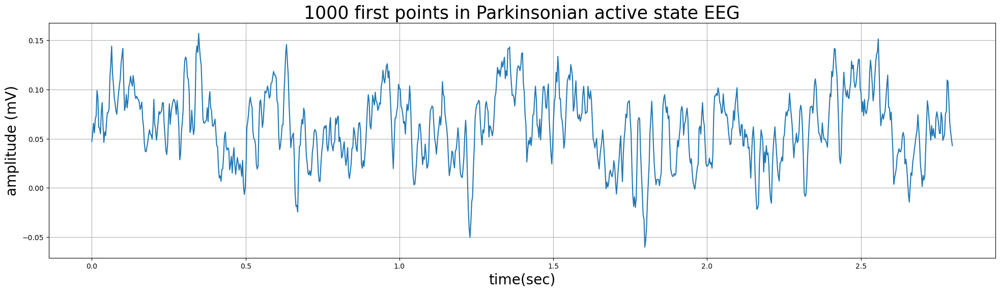

In [16]:
# Look up the 1000 first points in EEG trace                                                
time_EEG=np.linspace(0,duration,nb_sampling)     #we create the time vector corresponding to the time of each sampling
plt.figure(figsize = (24,6))
plt.plot(time_EEG[0:1000], EEG["values"][0][0:1000], color = '#1f77b4')
plt.title("1000 first points in Parkinsonian active state EEG", fontsize = 25)
plt.xlabel("time(sec)", fontsize = 20)
plt.ylabel("amplitude (mV)", fontsize = 20)
plt.grid()
plt.show()

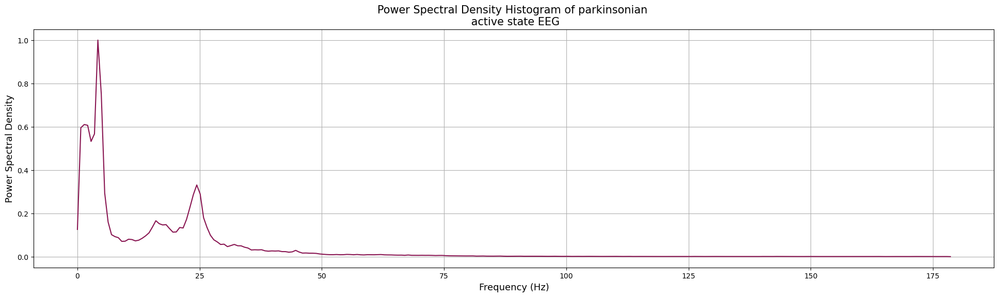

In [17]:
# Compute the spectral power density histogram (spectrum) of the EEG trace using scipy.signal.welch
fs_EEG = 1/(EEG["interval"][0])
frequencies, psd = scipy.signal.welch(EEG["values"][0],fs_EEG,nperseg=512)   # the larger nperseg the lower frequency you can determine but also the more low frequeny noise you will analyse. 
plt.figure(figsize = (24,6))
plt.plot(frequencies, psd/max(psd),color = '#891652') # we normalize the power spectrad density to the maximum psd (because we don't care about absolute value here)
plt.title("Power Spectral Density Histogram of parkinsonian \n active state EEG", fontsize = 15)
plt.xlabel("Frequency (Hz)", fontsize = 13)
plt.ylabel("Power Spectral Density", fontsize = 13);
plt.grid()
plt.show()

## Display and analysis of some neurons spike trains from parkinsonian group during active state

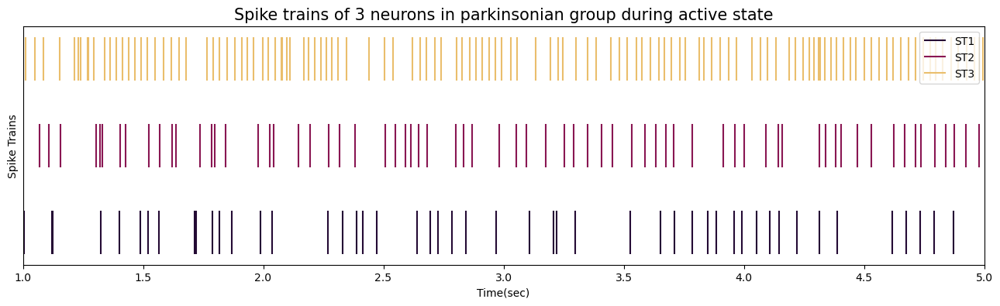

In [23]:
# Look up spike times for the two spike trains
ST1_times = ST1['times'][0]
ST2_times = ST2['times'][0]
ST3_times = ST3['times'][0]
#REPRESENT Spike trains
plt.figure(figsize = (16, 4)) 
plt.vlines(ST1_times, 1, 1.5, label = "ST1", color = '#240A34')
plt.vlines(ST2_times, 2, 2.5, label = "ST2", color = '#891652')
plt.vlines(ST3_times, 3, 3.5, label = "ST3", color = '#EABE6C')
plt.xlim(1,5)
plt.xlabel('Time (s)')
plt.ylabel('Spike Trains')
plt.title("Spike trains of 3 neurons in parkinsonian group during active state", fontsize =15)
plt.yticks([])
plt.legend()
plt.xlabel("Time(sec)")
plt.show()

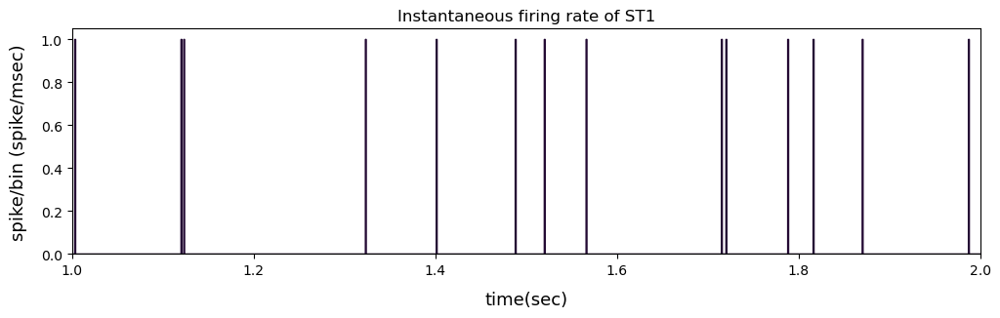

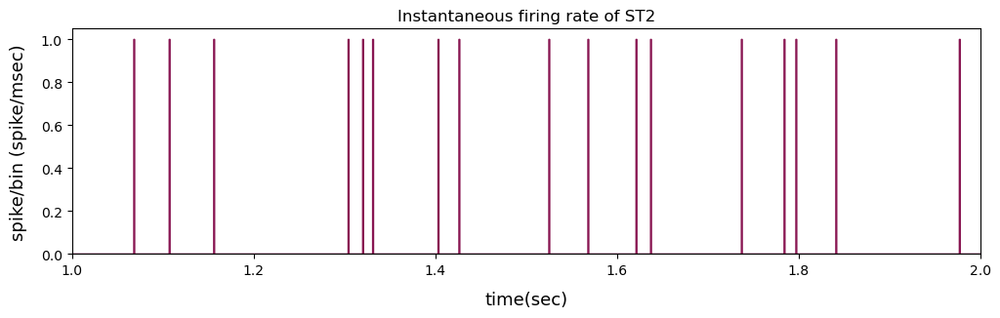

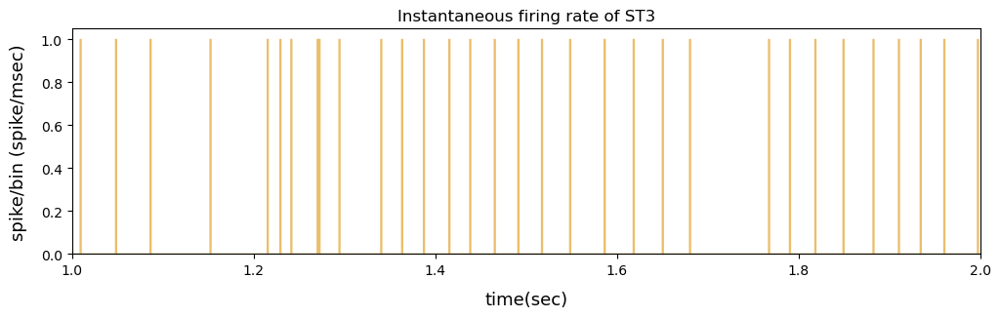

[1.6e-06]


In [25]:
# Make an instantaneous firing rate in bins of 1 ms using the function np.histogram and represent it for ST1, ST2 and ST3 of Activepark
# for the whole script the instantaneous firing rate is called "counts" (we realize too late that it was not a really appropriate name)
counts1, bin_edges1 = np.histogram(ST1["times"][0],range = [0,100], bins=int(duration/0.001)) # the number of bins equal the duration of the signal divided by the time of a bin (0.001 sec)
plt.figure(figsize = (12, 3))
plt.stairs(counts1, bin_edges1, color='#240A34')
plt.xlim(1,2) 
plt.title("Instantaneous firing rate of ST1")
plt.xlabel("time(sec)", fontsize = 13, labelpad=10)
plt.ylabel("spike/bin (spike/msec)", fontsize = 13, labelpad=10);
plt.show()

counts2, bin_edges2=np.histogram(ST2["times"][0],range = [0,100],bins=int(duration/0.001))
plt.figure(figsize = (12, 3))
plt.stairs(counts2, bin_edges2, color = '#891652')
plt.xlim(1,2)
plt.title("Instantaneous firing rate of ST2")
plt.xlabel("time(sec)", fontsize = 13, labelpad=10)
plt.ylabel("spike/bin (spike/msec)", fontsize = 13, labelpad=10);
plt.show()

counts3, bin_edges3=np.histogram(ST3["times"][0],range = [0,100],bins=int(duration/0.001))
plt.figure(figsize = (12, 3))
plt.stairs(counts3, bin_edges3,color = '#EABE6C')
plt.xlim(1,2)
plt.title("Instantaneous firing rate of ST3")
plt.xlabel("time(sec)", fontsize = 13, labelpad=10)
plt.ylabel("spike/bin (spike/msec)", fontsize = 13, labelpad=10);
plt.show()

print(ST1["resolution"][0])                                                                       # is that interval of sampling? it seems really small

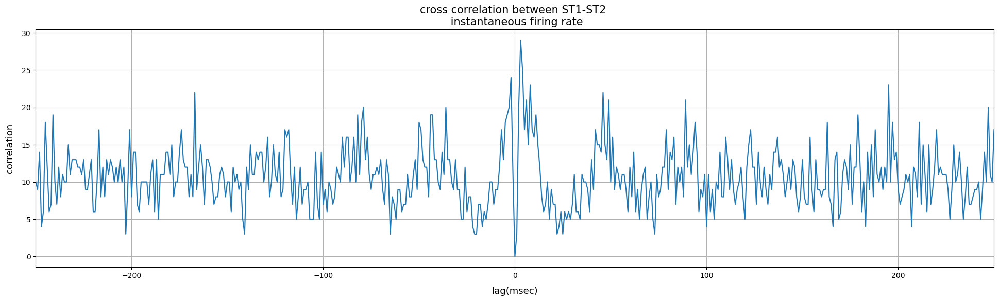

In [26]:
# Plot the crosscorrelogram of instantaneous firing rate (IFR) of spike train 1 and IFR of spike train 2 for delays from -250ms to +250ms
cross_corr12 = scipy.signal.correlate(counts1, counts2, mode='full', method='auto')     # we chose "auto" to automatically choose the most efficient computation method based on the input signal sizes                      
Time = np.linspace(-len(counts1)*1, len(counts2)*1, len(cross_corr12))      # Creation of lag vector : we multiply the number of bin within the instantaneous firing rate vector ("counts1") by 1 msec to convert the unit into time (in msec). We could have remove this multiplication because in this case the length of the bin is 1 (msec) but we left it to show how it should be in general  
plt.figure(figsize = (24, 6))
plt.plot(Time, cross_corr12, color = '#1f77b4')
plt.title("cross correlation between ST1-ST2 \n instantaneous firing rate", fontsize=15)
plt.xlabel("lag(msec)", fontsize = 13, labelpad=10)
plt.ylabel("correlation", fontsize = 13, labelpad=10);
plt.xlim(-250, 250)
plt.grid()
plt.show()

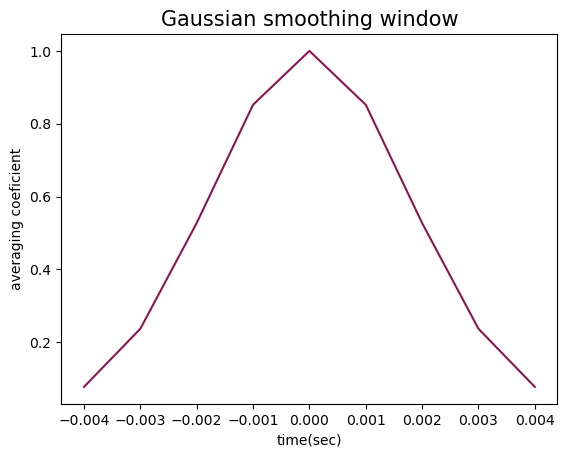

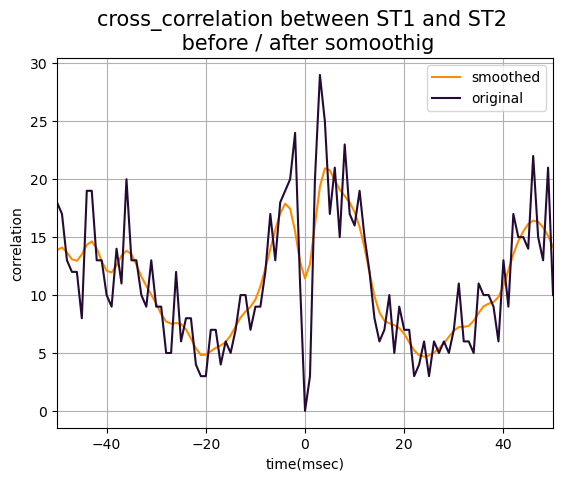

In [27]:
# Smooth the crosscorrelogram of instantaneous firing rate (IFR) of spike train 1 and IFR of spike train 2 and plot for delays from -50ms to +50ms

# We create a gaussian window to smoooth the signal by convolution

dt = 0.01 # length of the window, the bigger, the more noise we remove but the more signal we can also loose 
rate =1/0.001 # the rate of our instantaneous firing rate vectors ("counts", composed of 1msec bins)                                                                                                                
trange = int(dt*rate) # convert the window frome time to number of point
sigma = trange/4        # standard deviation for gaussian. Again the value is adjusted too smooth our signal enough but not too much
window = np.arange(-trange//2+1,trange//2,trange/10) #This line generates an array of sample indices centered around zero,

# Gaussian function over window with a standard deviation equal to sigma
gaussian = np.exp(-(window/sigma)**2)
plt.plot(window/rate, gaussian, color = '#891652')
plt.title("Gaussian smoothing window", fontsize=15)
plt.xlabel("time(sec)")
plt.ylabel("averaging coeficient")
plt.show()

smoothed_corr12= np.convolve(cross_corr12, gaussian, mode="same")/gaussian.sum()       # smoothing of cross-correlation 

#we plot original and smoothed cross-corelation
plt.title("cross_correlation between ST1 and ST2 \n before / after somoothig", fontsize=15)
plt.xlabel("time(msec)")                                                                
plt.ylabel("correlation")
plt.plot(Time,smoothed_corr12, label="smoothed", color = 'darkorange')                                        # we use the same time vector than for original signal
plt.plot(Time,cross_corr12, label="original", color = '#240A34')
plt.legend()
plt.xlim(-50,50)  
plt.grid()
plt.show()


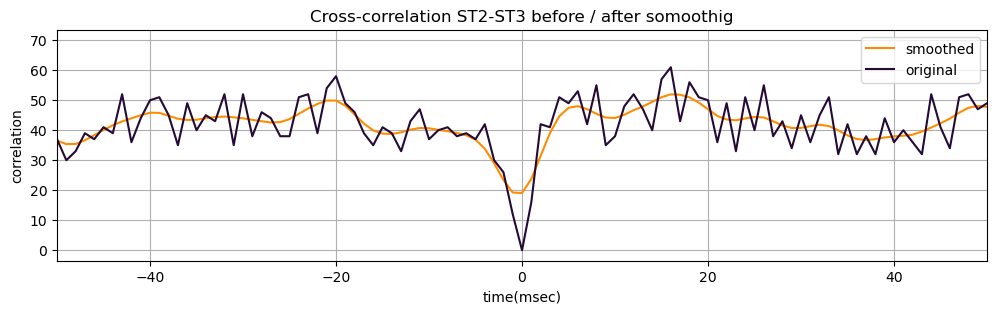

In [31]:
# Repeat the same procedure for spike trains 2 and 3
cross_corr23 = scipy.signal.correlate(counts2, counts3, mode='full', method='auto')
Time = np.linspace(-len(counts2)*1, len(counts3)*1,len(cross_corr23))
smoothed_corr23= np.convolve(cross_corr23, gaussian, mode="same")/gaussian.sum()      
plt.figure(figsize = (12, 3))
plt.title("Cross-correlation ST2-ST3 before / after somoothig")
plt.xlabel("time(msec)")                                                              
plt.ylabel("correlation")
plt.plot(Time,smoothed_corr23,label="smoothed", color = 'darkorange')
plt.plot(Time,cross_corr23,label="original", color = '#240A34')
plt.legend()
plt.xlim(-50,50) 
plt.grid()
plt.show()

['L23_Beat_cycl', 'L23_Beta_EEG', 'L23_EEGipsi', 'L23_Pr18_c08', 'L23_Pr20_c09', 'L23_Pr20_c0A', 'L23_Pr20_c0B', 'L23_Pr23_c0E', 'L23_Pr25_c10', 'L23_Pr25_c11', 'L23_Pr26_c12', 'L23_SS_Pr_1', 'L23_SS_Pr_11', 'L23_SS_Pr_17', 'L23_SS_Pr_21', 'L23_SS_Pr_22', 'L23_SS_Pr_3', 'L23_SS_Pr_7', 'L23_SS_Pr_9'] 19


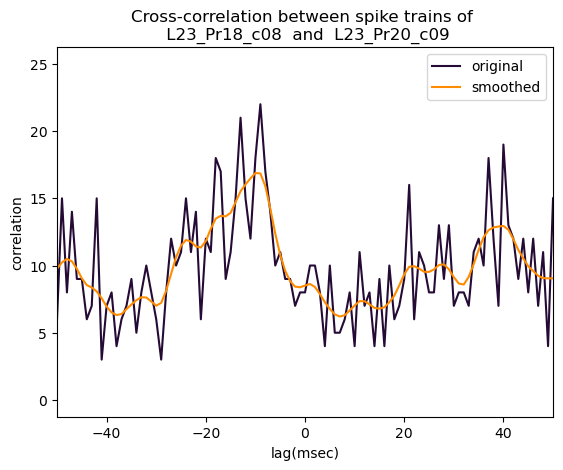

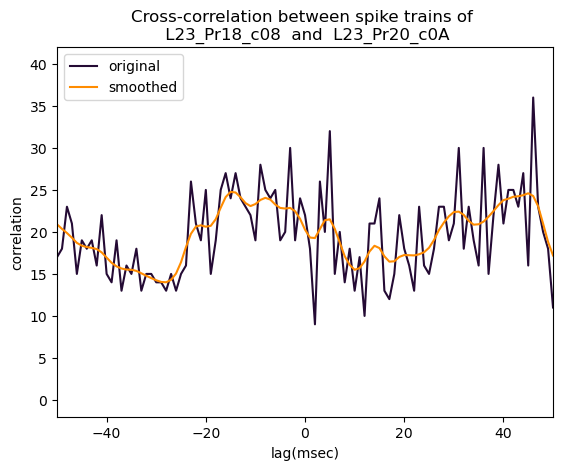

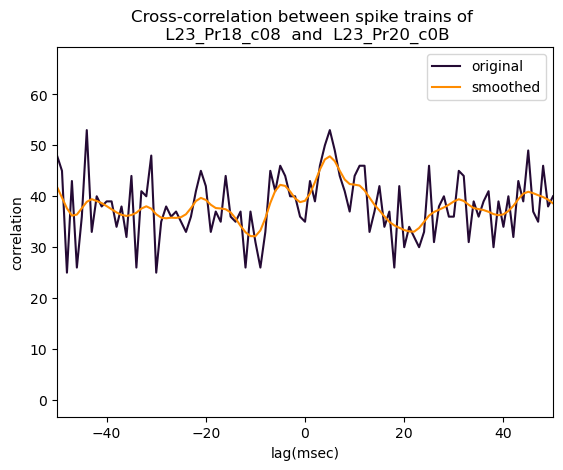

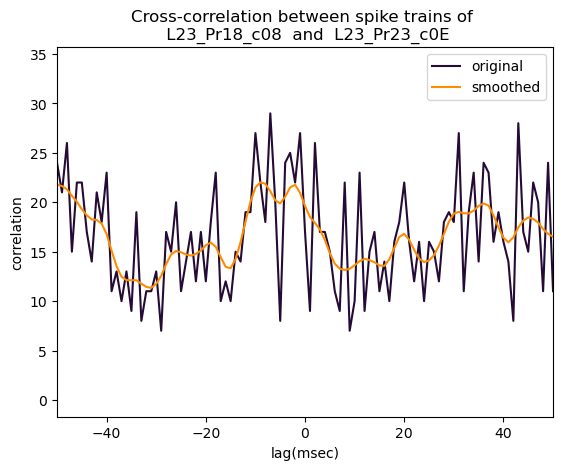

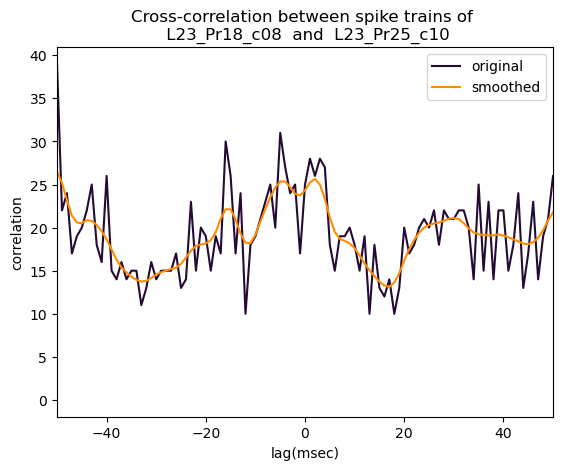

...

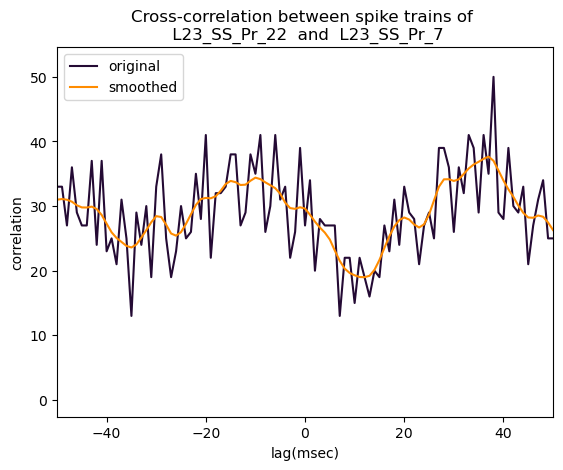

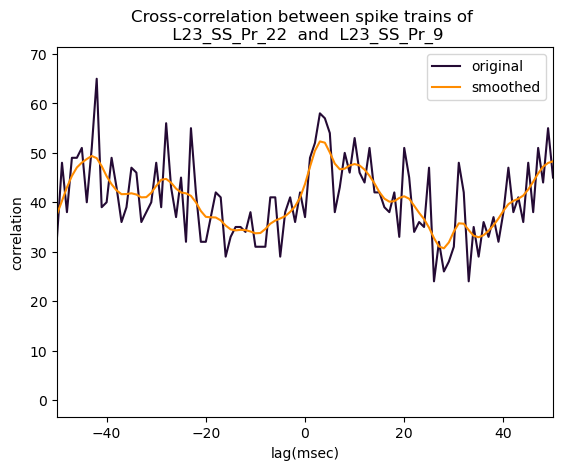

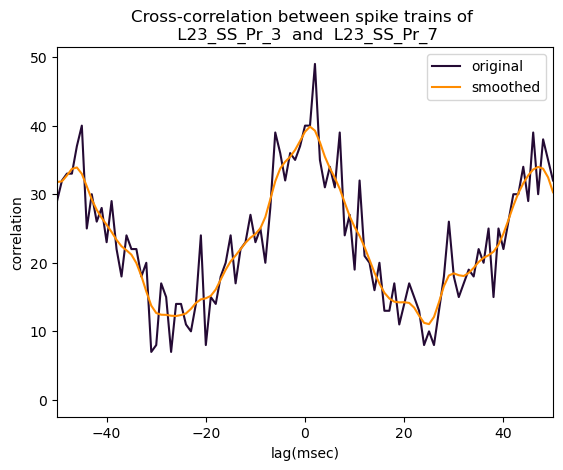

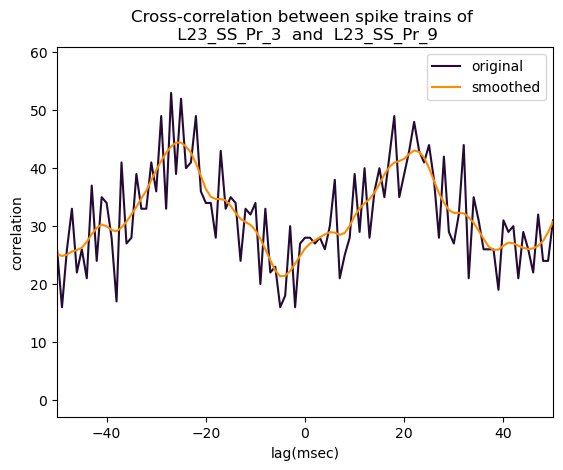

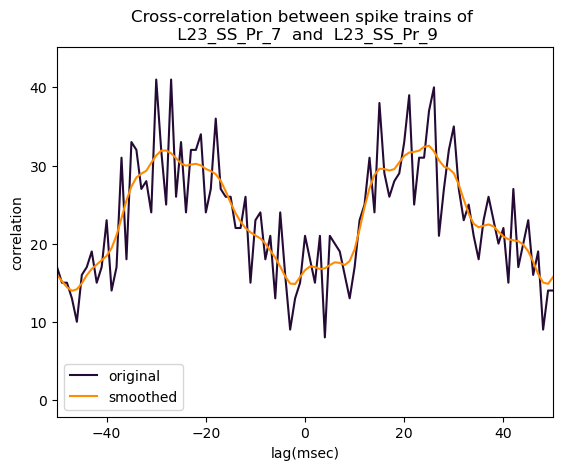

In [33]:
# Repeat the procedure (cells 11 and 12) for all pairs of spike trains recorded in this file (ActivPark)
# To this end, you may use the 'keys' of the dataset, corresponding to the various signals recorded simultaneously. 
# Note that the first 3 signals correspond to EEG or filtered EEG and will not be considered here. All other recorded signals are spike trains

keys=list(data['ActivPark'].keys()) 
print(keys, len(keys))


for i in list(range(3,len(keys))):   # we extract each spike train of activepark (but not the 3 first files that are not spike trains)
    STi=data['ActivPark'][keys[i]]
    countsi, bin_edgesi = np.histogram(STi["times"][0],range = [0,100], bins=int(duration/0.001)) # we create its IFR 
    for j in list(range(i+1,len(keys))):                
        STj=data['ActivPark'][keys[j]]            # we extract each spike train of activepark that have not been cross correlated yet to avoid repetition (so that for each pair of spike train (STx, STy) we don't have cross correlation of STx-STy and STy-STx)
        countsj, bin_edgesj = np.histogram(STj["times"][0],range = [0,100], bins=int(duration/0.001))  # we calculate its IFR 
        cross_corrij = scipy.signal.correlate(countsi, countsj, mode='full', method='auto')            # cross correlation of each pair
        Time=np.linspace(-len(countsi)*1, len(countsj)*1,len(cross_corrij))                            # lag vector for plotting
        smoothed_corrij= np.convolve(cross_corrij, gaussian, mode="same")/gaussian.sum()               #smoothing of each cross correlation
        plt.plot(Time,cross_corrij, label="original", color = '#240A34')                                                   # plotting ...
        plt.plot(Time,smoothed_corrij, label="smoothed", color = 'darkorange')
        plt.title("Cross-correlation between spike trains of \n {}  and  {}".format(keys[i],keys[j]))
        plt.xlabel("lag(msec)")                                                             
        plt.ylabel("correlation")
        plt.legend()
        plt.xlim(-50,50)  
        plt.show()

## Coherence analysis between spike trains and between spike trains and parkinsonian active state EEG

The maximum coherence betwwen ST1 and ST2 occur at [23.4375] Hz


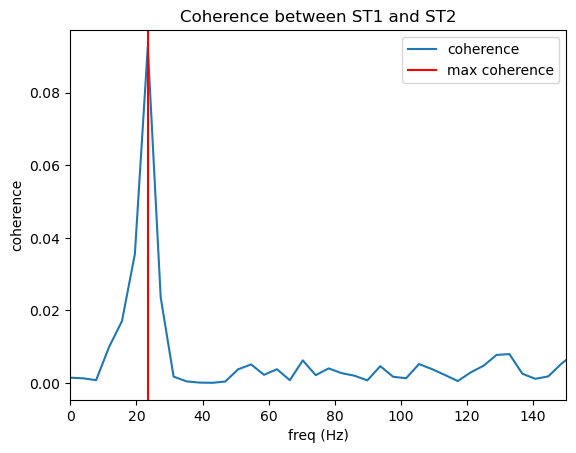

In [34]:
# Look at the coherence between instantaneous firing rate (IFR) of spike train 1 and IFR of spike train 2 with function scipy.signal.coherence
frequencies, C12 = scipy.signal.coherence(counts1, counts2, fs=1000) # fs is the number of bin (of 1msec) per sec, so 1000. 
plt.plot(frequencies,C12,label="coherence")
# Plot a vertical line at maximal coherence and get the corresponding frequency using the function plt.axvline
C12xmax=frequencies[np.where(C12 == np.max(C12))]   # we find the frequency for which the coherence is maximal
print("The maximum coherence betwwen ST1 and ST2 occur at {} Hz".format(C12xmax))


plt.axvline(C12xmax, color="r",label="max coherence")  # we put a line to visualize the frequency for which the coherence is maximal
plt.title("Coherence between ST1 and ST2")
plt.xlabel("freq (Hz)")                                                               
plt.ylabel("coherence")
plt.xlim(0,150)
plt.legend()
plt.show()



The maximum coherence betwwen ST1 and ST2 occur at [23.71651786] Hz


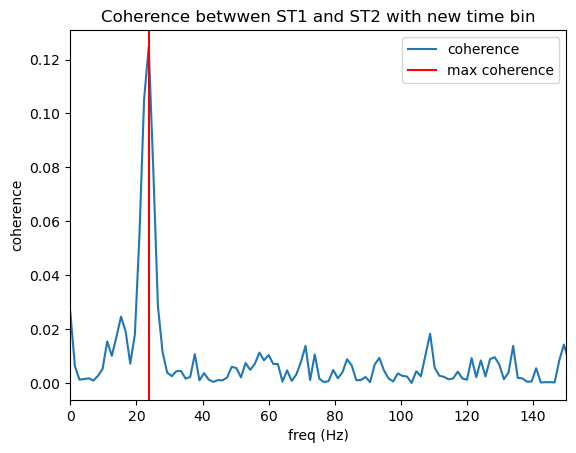

In [35]:
# We now want to compute the coherence between the EEG and the firing rates of single spike trains. 
# However, the coherence needs to be computed on signals that have the same sampling interval/rate

# First step: Recompute the IFR for a time bin similar to the EEG sampling interval
counts1bis, bin_edges1bis = np.histogram(ST1["times"][0], range = [0,100], bins=len(EEG["values"][0]))  # same as before but we recalculate the number of bins so that it is the same than the number of EEG values
counts2bis, bin_edges2bis = np.histogram(ST2["times"][0], range = [0,100], bins=len(EEG["values"][0]))
counts3bis, bin_edges3bis = np.histogram(ST3["times"][0], range = [0,100], bins=len(EEG["values"][0]))

# Second step: Look at the coherence between instantaneous firing rate (IFR) of spike train 1 and IFR of spike train 2 with new time bin
frequencies, C12bis = scipy.signal.coherence(counts1bis, counts2bis, fs=fs_EEG)
plt.plot(frequencies,C12bis,label="coherence")

# Plot a vertical line at maximal coherence and get the corresponding frequency using the function plt.axvline
C12bisxmax = frequencies[np.where(C12bis == np.max(C12bis))]
print("The maximum coherence betwwen ST1 and ST2 occur at {} Hz".format(C12bisxmax))
plt.axvline(C12bisxmax, color="r",label="max coherence")
plt.title("Coherence betwwen ST1 and ST2 with new time bin")
plt.xlabel("freq (Hz)")                                                               
plt.ylabel("coherence")
plt.xlim(0,150)
plt.legend()
plt.show()
                                                                                           

# This coherence can be compared to the one computed in cell 51.




The maximum coherence betwwen ST1 and EEG occur at [23.71651786] Hz


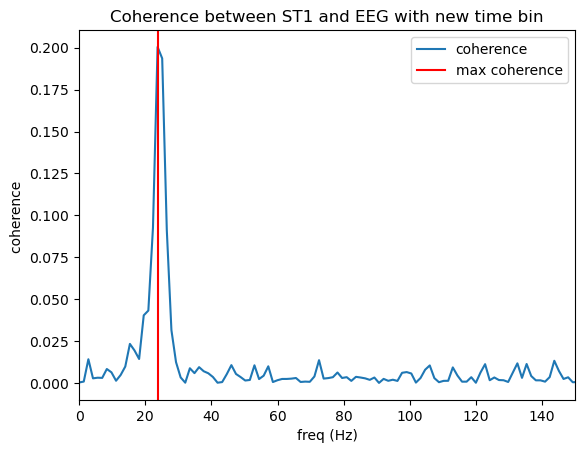

In [41]:
# Now we can compute the coherence between instantaneous firing rate (IFR) of a spike train and the EEG
frequencies, C1EEG = scipy.signal.coherence(counts1bis, EEG['values'][0], fs=fs_EEG)
plt.plot(frequencies,C1EEG, label="coherence")

# Plot a vertical line at maximal coherence and get the corresponding frequency
C1EEGxmax=frequencies[np.where(C1EEG == np.max(C1EEG))]

print("The maximum coherence betwwen ST1 and EEG occur at {} Hz".format(C1EEGxmax))
plt.axvline(C1EEGxmax, color="r",label="max coherence")
plt.title("Coherence between ST1 and EEG with new time bin")
plt.xlabel("freq (Hz)")                                                            
plt.ylabel("coherence ")
plt.legend()
plt.xlim(0,150)
plt.show()

# Analysis of spike trains and EEG during Slow wave state of parkinsonian group (SWAPark file) 

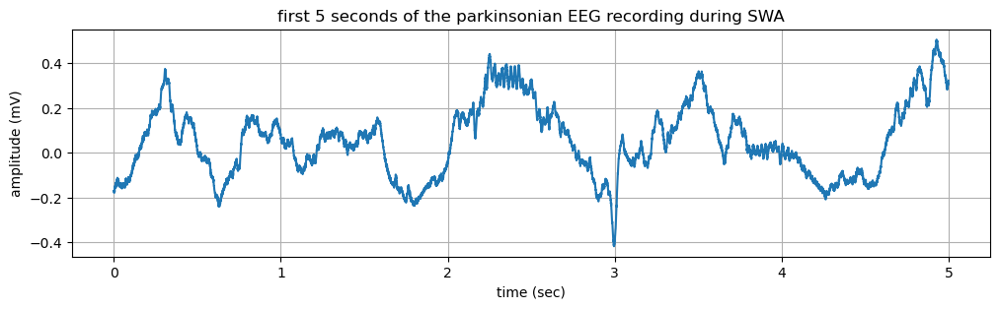

In [46]:
# Let's now look up a file with SWA activity in the cortex, and plot the first 5 seconds of this EEG
EEG=data['SWAPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

duration= len(EEG_data)*EEG_interval          
time=np.linspace(0,duration,len(EEG_data))     #create the time vector

plt.figure(figsize = (12, 3))
plt.plot(time[:int(5/EEG_interval)], EEG_data[:int(5/EEG_interval)], color = '#1f77b4');
plt.title("first 5 seconds of the parkinsonian EEG recording during SWA")
plt.xlabel("time (sec)")                                                                
plt.ylabel("amplitude (mV)")
plt.grid()
plt.show()



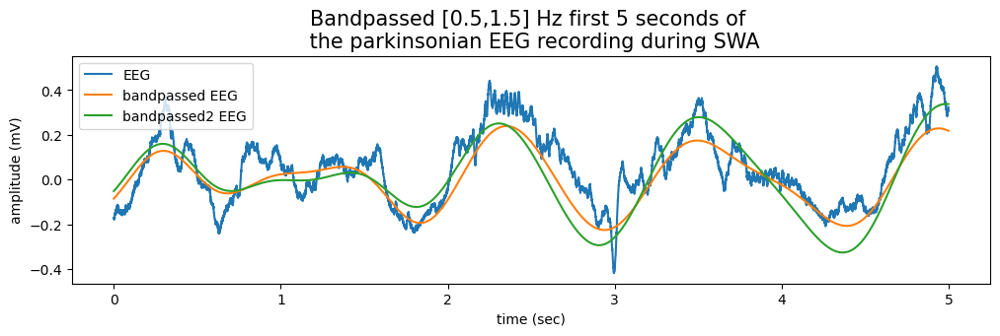

In [48]:
# Build a band pass filter with [0.5 1.5] Hz band for EEG using scipy.signal.butter
EEG_frequency=1/EEG_interval    

#Here are two alternatives bandpass
#The first do low pass fliltering and then highpass; second one directly do a bandpass
#For the rest of the script we use the first bandpass function as it seems more acurate than second one

def bandpass(cutofflow,cutoffhigh,data,fs,order=5):    # we adjusted the order manually so that the filter works well
    fnyq = 0.5 * EEG_frequency                         # Nyquist frequency of EEG, the highest frequency you can detect based on your sampling frequecy
    normal_cutofflow = cutofflow / fnyq                # cutoff frequency normalized to Nyquist frequency
    b, a = scipy.signal.butter(order, normal_cutofflow, btype='low', output='ba', fs=2, analog=False) #low pass filter
    y = scipy.signal.filtfilt(b, a, data)                                                             # apply filter to signal
    normal_cutoffhigh = cutoffhigh / fnyq 
    c, d = scipy.signal.butter(order, normal_cutoffhigh, btype='high', output='ba', fs=2, analog=False)  #High pass filtering
    y = scipy.signal.filtfilt(c, d, y)                                                                   # apply filter to signal
    return y
    
def bandpass2(cutofflow,cutoffhigh,data,fs,order=5): 
    fnyq = 0.5 * fs
    normal_cutofflow = cutofflow / fnyq
    normal_cutoffhigh = cutoffhigh / fnyq
    e,f= scipy.signal.butter(3, [normal_cutoffhigh,normal_cutofflow], btype="bandpass", analog=False, output='ba', fs=2)
    y = scipy.signal.filtfilt(e, f, data)
    return y

EEG_data2= bandpass(1.5,0.5,EEG_data,EEG_frequency)                                    # here we use our bandpass functions to filter EEG
EEG_data2alternative=bandpass2(1.5, 0.5, EEG_data, EEG_frequency)
plt.figure(figsize = (12, 3))
plt.plot(time[:int(5/EEG_interval)],EEG_data[:int(5/EEG_interval)], label="EEG");      # and we plot them
plt.plot(time[:int(5/EEG_interval)],EEG_data2[:int(5/EEG_interval)],label="bandpassed EEG");
plt.plot(time[:int(5/EEG_interval)],EEG_data2alternative[:int(5/EEG_interval)],label="bandpassed2 EEG")
plt.title("Bandpassed [0.5,1.5] Hz first 5 seconds of \n the parkinsonian EEG recording during SWA", fontsize=15)
plt.xlabel("time (sec)")                                                               
plt.ylabel("amplitude (mV)")
plt.legend()
plt.show()

len(ST1_times) 3294
ST1_times[i1] 1.9998095999999999
ST1_times[i2] 98.0174096
spike-triggered average at 0 time lag : -0.024225651780057977


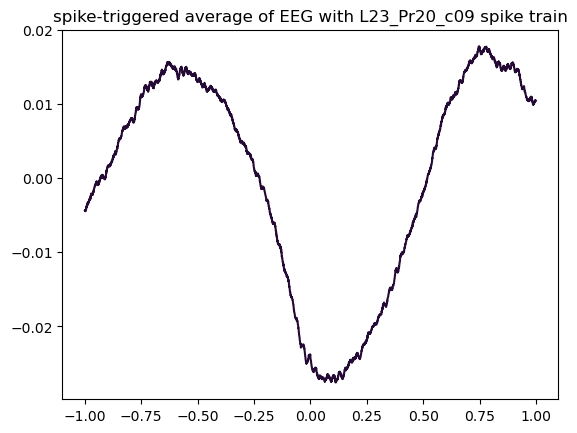

In [54]:
# Load one spike train and the EEG values and sampling interval from the SWAPark file (given)
ST1=data['SWAPark']['L23_Pr20_c09']
ST1_times=ST1['times'][0]
print("len(ST1_times)",len(ST1_times))

EEG=data['SWAPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]


# Compute the spike-triggered average of the EEG trace with the first spike train
windowsec=2; windowint=windowsec/EEG_interval; 
t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval)
STA=np.zeros(int(windowint))
i1=np.argmin(np.abs(ST1_times-windowsec))
i2=np.argmin(np.abs(ST1_times-(len(EEG_data)*EEG_interval-windowsec)))
print("ST1_times[i1]",ST1_times[i1])
print("ST1_times[i2]",ST1_times[i2])
for i in range(i1,i2):
    STA += EEG_data[int(ST1_times[i+1]/EEG_interval)-int(windowint/2)-1:int(ST1_times[i+1]/EEG_interval)+int(windowint/2)] 

STA=STA/(len(ST1_times)-2)   # why not STA=STA/(len(ST1_times[i1,i2])-2), because here we average a 2 seconds window of EEG trace around each spike. But we only focus on the spikes between i1 and i2, not on all of themso we have len(ST1_times)-2 traces to average
STA=STA-np.mean(STA)
plt.plot(t, STA, color = '#240A34')
plt.title("spike-triggered average of EEG with L23_Pr20_c09 spike train")

# Value of the spike-triggered average at 0 time lag
print("spike-triggered average at 0 time lag :", STA[int(windowint/2)]) 


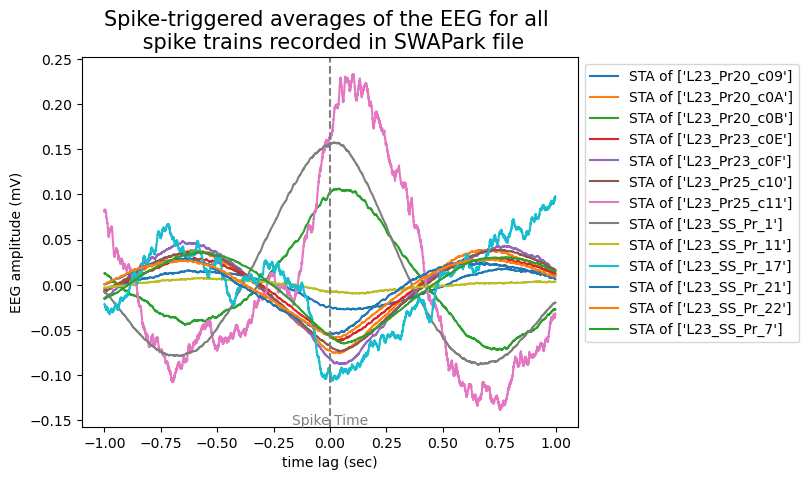

In [56]:
# Compute and plot the spike-triggered averages of the EEG with respect to all spike trains recorded in this SWAPark file
# You may use the keys of the data['SWAPark'] data set
# Save the value of the spike-triggered average at 0 time lag for all considered spike trains

keys=list(data['SWAPark'].keys()) # we will use this key vector to access alll spike trains in the following loop
EEG=data['SWAPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

windowsec=2; windowint=windowsec/EEG_interval; #define the window length (in time annd in number of EEG sample). the window is the length of EEG signal around spikes we will focus on
t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval) 
STAall=np.zeros(int(windowint))   # we create empty vector to sum all EEG signals around spikes for each spike train 
STA0s={}                          # we create empty dictionnary to store spike trigerred average EEG value at time 0 for all spike trains
for i in keys[1:]:                # we extract all spike trains of SWAPark (we don't take first file as it is EEG)
    STAi=np.zeros(int(windowint))                 #we create an empty array for the futur EEG signal summation
    STi_times=data['SWAPark'][i]['times'][0]
    j1=np.argmin(np.abs(STi_times-windowsec)) 
    j2=np.argmin(np.abs(STi_times-(len(EEG_data)*EEG_interval-windowsec)))          #j1 and j2 are the time boundaries of the part of the EEG and spike train signal that we will focus on. The point is to focus on the spike for which we can take a full 2 sec window of EEG signal around it. Here we think we could have use windowsec/2 instead of windowsec but we used the code you wrote before  
    for j in range(j1,j2):                                                          
        STAi += EEG_data[int(STi_times[j+1]/EEG_interval)-int(windowint/2)-1:int(STi_times[j+1]/EEG_interval)+int(windowint/2)] # for each spike between j1 and j2, we sum the EEG signal 1 second before and after it (in the empty array we've created before)
    STAi=STAi/(len(STi_times)-2)                                                    # we divide the summated EEG traces by the number of traces to make an average. To us we should use STi_times[j1,j2] for the average to be correct but again we used the previous code as a model.
    STAi=STAi-np.mean(STAi)                                                         # we center this avearge trace around 0
    STA0s[i]=STAi[int(windowint/2)]                                                 # we determine the value of the spike-triggered average at 0 time lag
    plt.plot(t,STAi, label = "STA of {}".format([i]))                               # we plot...
plt.title("Spike-triggered averages of the EEG for all \n spike trains recorded in SWAPark file", fontsize=15)
plt.xlabel("time lag (sec)")                                                                
plt.ylabel("EEG amplitude (mV)")
plt.axvline(x=0, color='gray', linestyle='--')  # Vertical line at x=0
plt.text(0, -0.15, 'Spike Time', ha='center', va='center', fontsize=10, color='gray')
plt.legend(loc = 'upper left', bbox_to_anchor = (1, 1))
plt.show()





GPT-I group: ['L23_Pr20_c09', 'L23_Pr20_c0A', 'L23_Pr23_c0E', 'L23_Pr23_c0F', 'L23_Pr25_c10', 'L23_SS_Pr_11', 'L23_SS_Pr_17', 'L23_SS_Pr_21', 'L23_SS_Pr_22', 'L23_SS_Pr_7']
GPT-A group: ['L23_Pr20_c0B', 'L23_Pr25_c11', 'L23_SS_Pr_1']


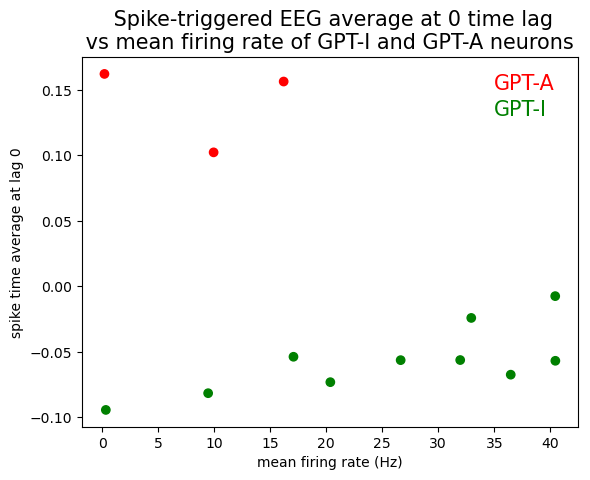

In [68]:
# We sort sort the GPT_I GPT_A neurons (not asked but used for report)
#GPT-A are neurons firing mostly during the up state of EEG SWA (so the value of the spike-triggered average at 0 time lag is positive)
# GPT-I are neurons firing mostly during the down state of EEG SWA (so the value of the spike-triggered average at 0 time lag is negative)
GPT_I=[]
GPT_A=[]
for i in STA0s:
    if STA0s[i]<=0:
        GPT_I.append(i)
    if STA0s[i]>0:
        GPT_A.append(i)
print("GPT-I group:", GPT_I)
print("GPT-A group:", GPT_A)


# For each spike train in the data set, compute the mean firing rate 

MFR={}        #empty dictionnary to store the MFR of each spike train of the data set
for i in keys[1:]:
    STi_times=data['SWAPark'][i]['times'][0]    # we extract time of each spike for each spike train 
    MFR_STi= len(STi_times)/np.max(STi_times)   # the mean firing rate is the number of spike divided by the length of recording 
    MFR[i]=MFR_STi                              # we put the value in the dictionnary                       


# Plot the mean firing rate of the spike trains vs the value of the spike-triggered average at 0 time lag
# we transform our dictionary in list and we assign a different color to GPT-I and GPT-A neurons (that is stored in an other list
MFRlist=[]
STA0slist=[]
colors=[]
for key in STA0s.keys():
    if key in MFR:  # Ensure the key exists in both dictionaries
        STA0slist.append(STA0s[key])
        MFRlist.append(MFR[key])
        if key in GPT_A:
            colors.append('red') 
        else:
            colors.append('green')
plt.scatter(MFRlist,STA0slist,c=colors) # we use those 3 lists to plot STA0 against MFR with GPT-A in red and GPT-I in blue
plt.xlabel("mean firing rate (Hz)") 
plt.ylabel("spike time average at lag 0")
plt.title(" Spike-triggered EEG average at 0 time lag\n vs mean firing rate of GPT-I and GPT-A neurons ", fontsize=15)
plt.annotate("GPT-A",xy=(35,0.15), color = "red", fontsize=15)
plt.annotate("GPT-I",xy=(35,0.13), color = "green", fontsize=15)
plt.show()


# PART2 
### Once we understood all the tools presented in the notebook, we used them to analyse all files to answer our questions and make figures for report

# Question 1 : Is there a difference between frequency composition of EEG of Parkinsonian or control group (in slow wave and active state) ?
### Here we just reused the code for spectral density analysis and applied to the four groups (ActivPark, ActivCtl, SWAPark, SWACtl)
### Conclusion: A pic in beta frequency in EEG during active state of parkinsonian group seem to be a marker of the disease (that was already known but we confirm it)

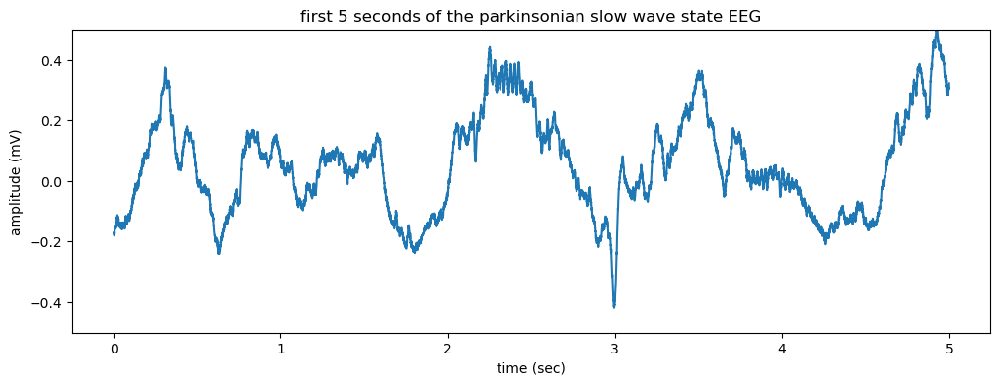

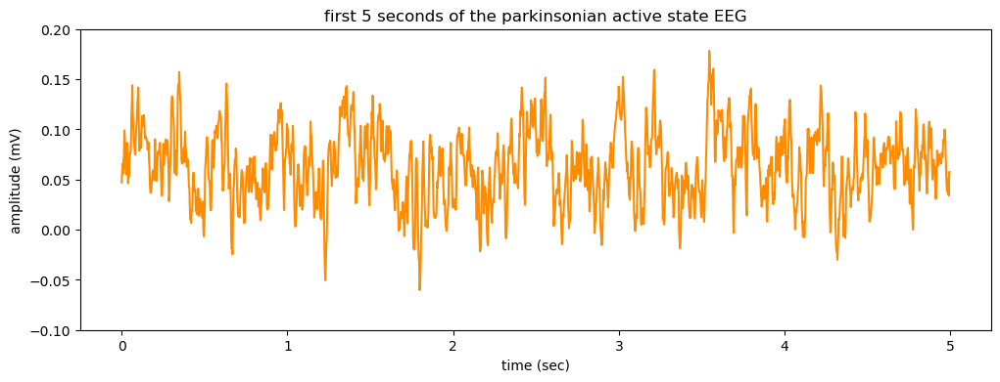

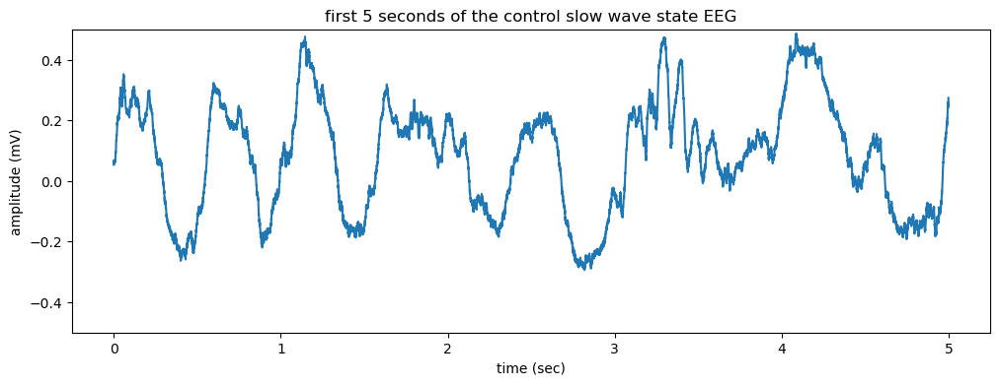

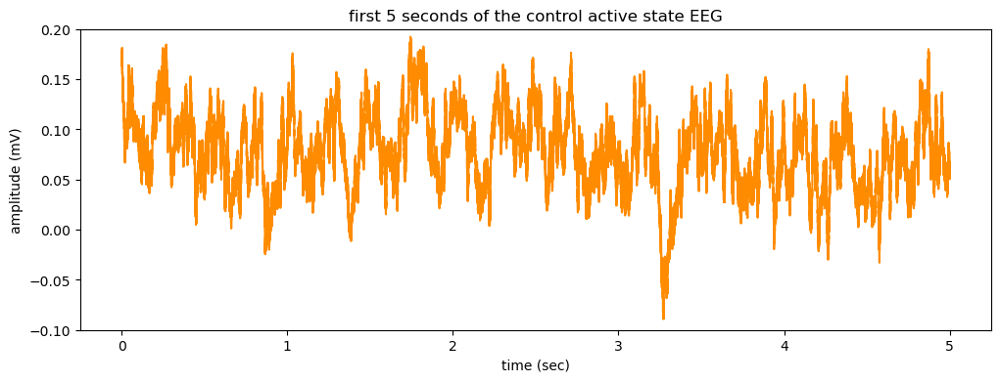

In [74]:
# For represent purpose (figures) we display all 4 files EEG 5 first seconds
EEG=data['SWAPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

duration= len(EEG_data)*EEG_interval          
time=np.linspace(0,duration,len(EEG_data))    

plt.figure(figsize = (12, 4))
plt.plot(time[:int(5/EEG_interval)], EEG_data[:int(5/EEG_interval)]);
plt.title("first 5 seconds of the parkinsonian slow wave state EEG")
plt.xlabel("time (sec)")                                                                
plt.ylabel("amplitude (mV)")
plt.ylim(-0.5, 0.5)
plt.savefig("first 5 seconds of the parkinsonians low wave state EEG")

plt.show()


EEG=data['ActivPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

duration= len(EEG_data)*EEG_interval          
time=np.linspace(0,duration,len(EEG_data))   

plt.figure(figsize = (12, 4))
plt.plot(time[:int(5/EEG_interval)], EEG_data[:int(5/EEG_interval)],color = "darkorange");
plt.title("first 5 seconds of the parkinsonian active state EEG")
plt.xlabel("time (sec)")                                                                
plt.ylabel("amplitude (mV)")
plt.ylim(-0.10, 0.2)
plt.savefig("first 5 seconds of the parkinsonians active state EEG")
plt.show()

EEG=data['SWACtl']["A9_EEGipsi"]
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

duration= len(EEG_data)*EEG_interval          
time=np.linspace(0,duration,len(EEG_data))    

plt.figure(figsize = (12, 4))
plt.plot(time[:int(5/EEG_interval)], EEG_data[:int(5/EEG_interval)]);
plt.title("first 5 seconds of the control slow wave state EEG")
plt.xlabel("time (sec)")                                                                
plt.ylabel("amplitude (mV)")
plt.ylim(-0.5, 0.5)
plt.savefig("first 5 seconds of the control slow wave state EEG")
plt.show()

EEG=data['ActivCtl']['A9_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

duration= len(EEG_data)*EEG_interval          
time=np.linspace(0,duration,len(EEG_data))    

plt.figure(figsize = (12, 4))
plt.plot(time[:int(5/EEG_interval)], EEG_data[:int(5/EEG_interval)], color = "darkorange");
plt.title("first 5 seconds of the control active state EEG")
plt.xlabel("time (sec)")                                                                
plt.ylabel("amplitude (mV)")
plt.ylim(-0.10, 0.2)
plt.savefig("first 5 seconds of the control active state EEG")
plt.show()

C:\Users\huawei\AppData\Local\Temp\ipykernel_2260\2566448575.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  frequencies, psd = scipy.signal.welch(EEG["values"][0],fs_EEG,nperseg=int(fs_EEG))
C:\Users\huawei\AppData\Local\Temp\ipykernel_2260\2566448575.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  frequencies, psd = scipy.signal.welch(EEG["values"][0],fs_EEG,nperseg=int(fs_EEG))


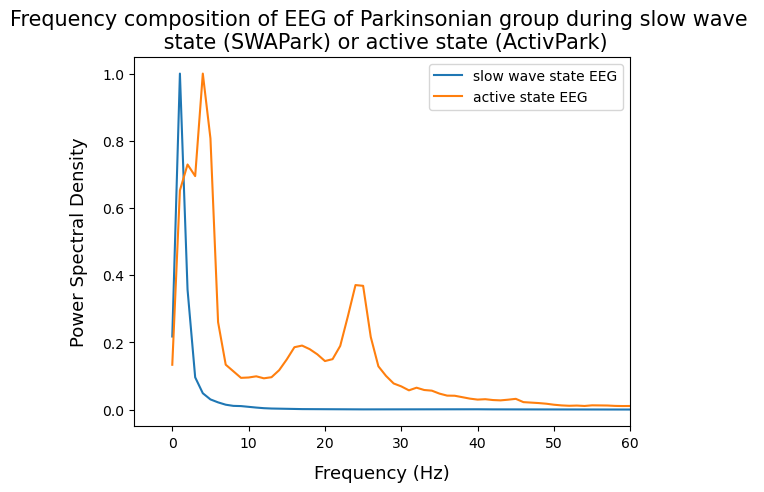

C:\Users\huawei\AppData\Local\Temp\ipykernel_2260\2566448575.py:33: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  frequencies, psd = scipy.signal.welch(EEG["values"][0],fs_EEG, nperseg=int(fs_EEG))
C:\Users\huawei\AppData\Local\Temp\ipykernel_2260\2566448575.py:40: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  frequencies, psd = scipy.signal.welch(EEG["values"][0],fs_EEG,nperseg=int(fs_EEG))


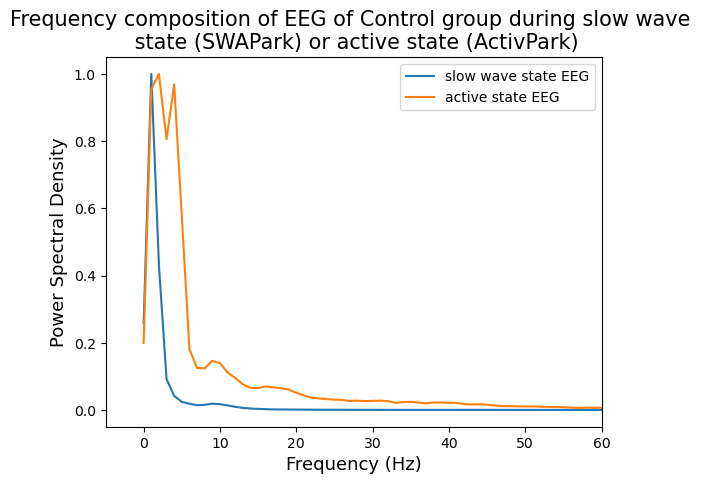

In [82]:
# Fig1 : power spectral analysis of the 4 files
# because the sampling frequency of the different EEG was really different, the npersec must be adjusted to get a similar frequency resolution for all grph. Here we thus used the sampling frequency as nperseg value


EEG=data['SWAPark']['L23_EEGipsi']
nb_sampling=len(EEG["values"][0])
duration=(nb_sampling-1)*EEG["interval"][0][0]
time_EEG=np.linspace(0,duration,nb_sampling)
fs_EEG = 1/(EEG["interval"][0])
frequencies, psd = scipy.signal.welch(EEG["values"][0],fs_EEG,nperseg=int(fs_EEG)) 
plt.plot(frequencies, psd/max(psd), label="slow wave state EEG")
EEG=data['ActivPark']['L23_EEGipsi']
nb_sampling=len(EEG["values"][0])
duration=(nb_sampling-1)*EEG["interval"][0][0]
fs_EEG = 1/(EEG["interval"][0])
frequencies, psd = scipy.signal.welch(EEG["values"][0],fs_EEG,nperseg=int(fs_EEG))   
plt.plot(frequencies, psd/max(psd), label="active state EEG")
plt.title("Frequency composition of EEG of Parkinsonian group during slow wave \n state (SWAPark) or active state (ActivPark)", fontsize=15)
plt.xlabel("Frequency (Hz)", fontsize = 13, labelpad=10)
plt.ylabel("Power Spectral Density", fontsize = 13, labelpad=10);
plt.legend()
plt.xlim(-5,60)
plt.savefig("Frequency composition of EEG of Parkinsonian group durig  slow wave state (SWAPark) or active state (ActivPark)")
plt.show()



EEG=data['SWACtl']["A9_EEGipsi"]
nb_sampling=len(EEG["values"][0])
duration=(nb_sampling-1)*EEG["interval"][0][0]
time_EEG=np.linspace(0,duration,nb_sampling)
fs_EEG = 1/(EEG["interval"][0])
frequencies, psd = scipy.signal.welch(EEG["values"][0],fs_EEG, nperseg=int(fs_EEG))   
plt.plot(frequencies, psd/max(psd),label="slow wave state EEG")
EEG=data['ActivCtl']['A9_EEGipsi']
nb_sampling=len(EEG["values"][0])
duration=(nb_sampling-1)*EEG["interval"][0][0]
time_EEG=np.linspace(0,duration,nb_sampling)
fs_EEG = 1/(EEG["interval"][0])
frequencies, psd = scipy.signal.welch(EEG["values"][0],fs_EEG,nperseg=int(fs_EEG))  
plt.plot(frequencies, psd/max(psd), label="active state EEG")
plt.title("Frequency composition of EEG of Control group during slow wave \n state (SWAPark) or active state (ActivPark)", fontsize=15)
plt.xlabel("Frequency (Hz)", fontsize = 13)
plt.ylabel("Power Spectral Density", fontsize = 13);
plt.legend()
plt.xlim(-5,60)
plt.savefig("Frequency composition of EEG of Control group durig  slow wave state (SWAPark) or active state (ActivPark)")
plt.show()

# QUESTION 2 : Are there some synchronized neurons during active state and do they show synchrony with EEG ? 
## We look at the cross-correlation between spike trains to see synchronization, and then at the coherence between them (and with EEG) to see what is the most shared firing frequency of those neurones

## Conclusion: some neurons fire in phase, some in phase oposition and some are not synchronized. Those neurons firing show coherence in the beta frequency. Those neurons also show coherence with the EEG at beta frequency.
## Neurons synchrony in phase or phase oposition lead to the idea that their might be different groups of neurons

['L23_Beat_cycl', 'L23_Beta_EEG', 'L23_EEGipsi', 'L23_Pr18_c08', 'L23_Pr20_c09', 'L23_Pr20_c0A', 'L23_Pr20_c0B', 'L23_Pr23_c0E', 'L23_Pr25_c10', 'L23_Pr25_c11', 'L23_Pr26_c12', 'L23_SS_Pr_1', 'L23_SS_Pr_11', 'L23_SS_Pr_17', 'L23_SS_Pr_21', 'L23_SS_Pr_22', 'L23_SS_Pr_3', 'L23_SS_Pr_7', 'L23_SS_Pr_9'] 19


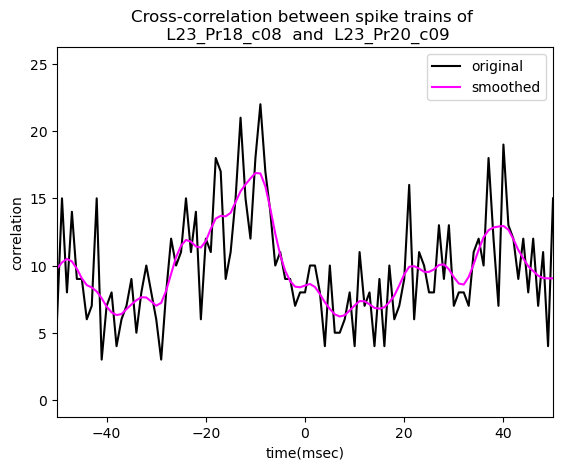

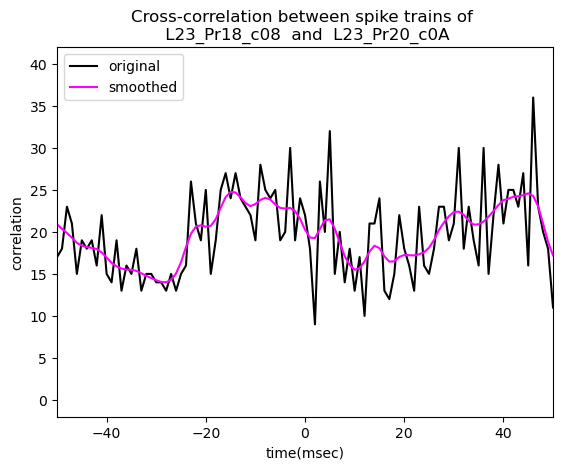

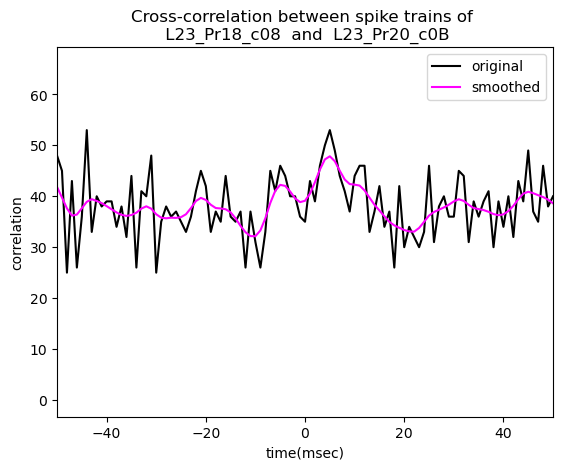

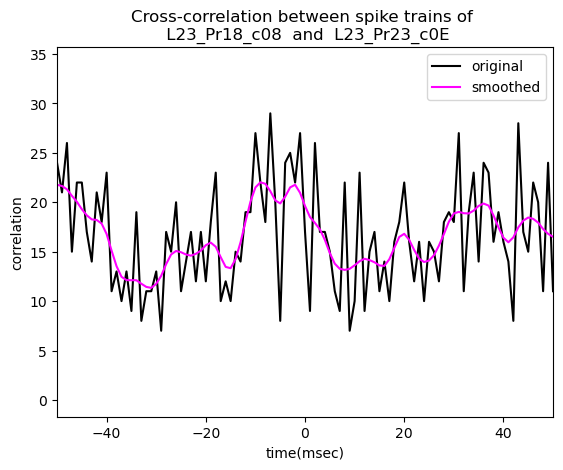

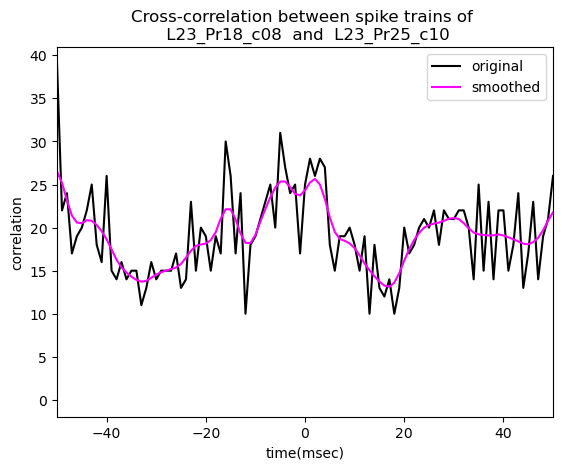

...

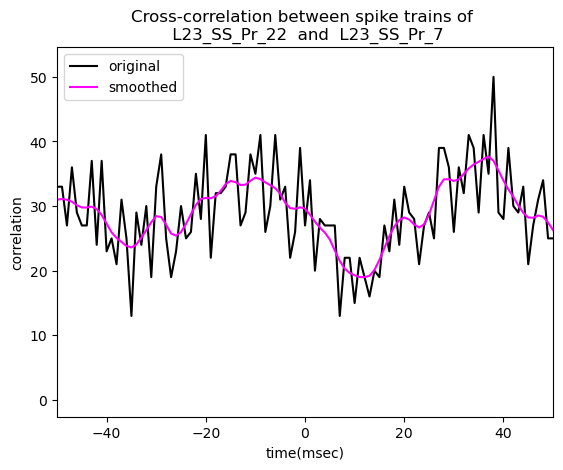

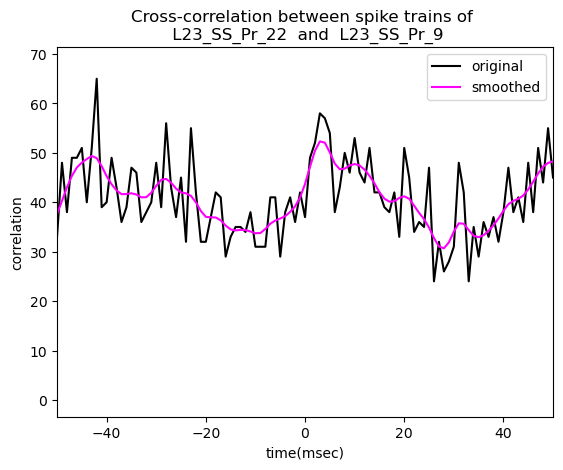

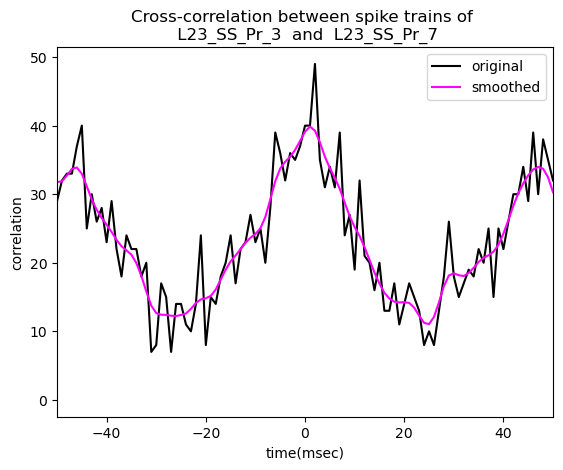

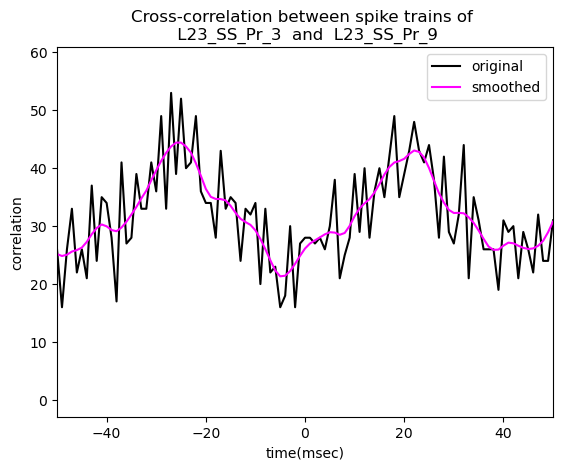

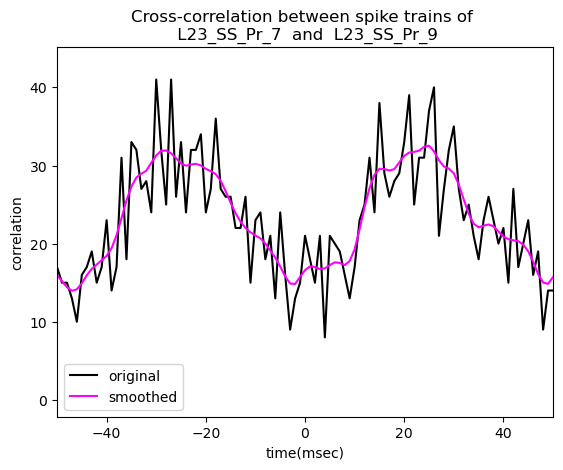

In [95]:
#Fig 2: correlation between each pair of neuron in ActivPark to choose those not synchronized, synchronized in phase and synchronized in phase oposition (copy/paste of what was done previously)
keys=list(data['ActivPark'].keys())
print(keys, len(keys))


for i in list(range(3,len(keys))):
    STi=data['ActivPark'][keys[i]]
    countsi, bin_edgesi = np.histogram(STi["times"][0],range = [0,100], bins=int(duration/0.001))
    for j in list(range(i+1,len(keys))):
        STj = data['ActivPark'][keys[j]]
        countsj, bin_edgesj = np.histogram(STj["times"][0],range = [0,100], bins=int(duration/0.001))
        cross_corrij = scipy.signal.correlate(countsi, countsj, mode='full', method='auto')
        Time = np.linspace(-len(countsi)*1, len(countsj)*1,len(cross_corrij))
        smoothed_corrij= np.convolve(cross_corrij, gaussian, mode="same")/gaussian.sum()
        plt.plot(Time,cross_corrij,label="original",color="k")
        plt.plot(Time,smoothed_corrij,label="smoothed",color="magenta")
        plt.title("Cross-correlation between spike trains of \n {}  and  {}".format(keys[i],keys[j]))
        plt.xlabel("time(msec)")                                                                
        plt.ylabel("correlation")
        plt.legend()
        plt.xlim(-50,50) 
        plt.savefig("Cross-correlation between spike trains of {}  and  {}".format(keys[i],keys[j]))
        plt.show()
    

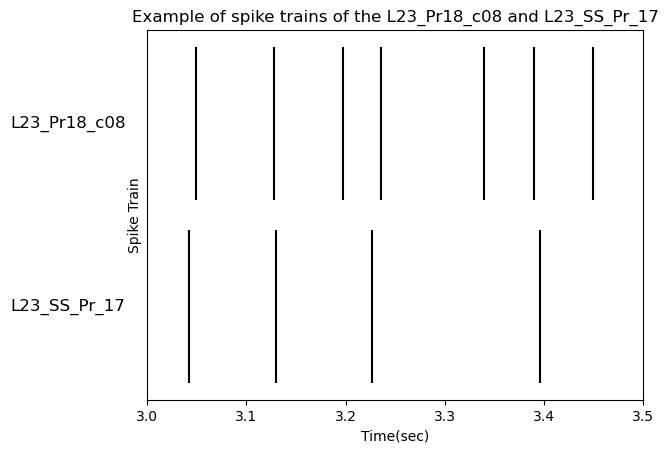

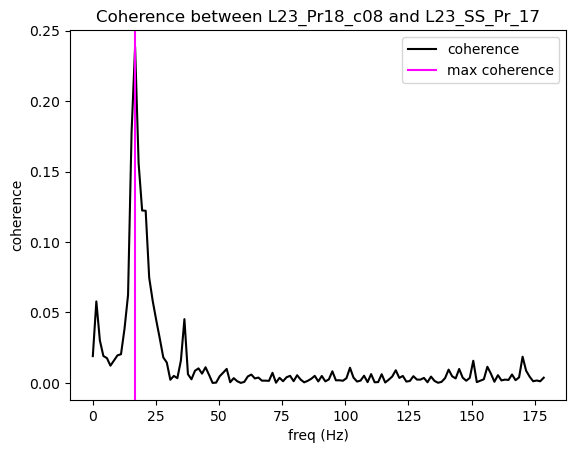

The maximum coherence occur at [16.74107143] Hz


In [101]:
#Fig 2 we look at the spike trains (just for the figures) and at the coherence between some neurons for which correlation showed they were in phase syncronization  
EEG=data['ActivPark']['L23_EEGipsi']
fs_EEG = 1/(EEG["interval"][0])
ST1=data['ActivPark']['L23_Pr18_c08']
ST2=data["ActivPark"]["L23_SS_Pr_17"]

plt.vlines(ST1["times"][0],-0.40,-0.50,"k")
plt.vlines(ST2["times"][0],-0.52,-0.62,"k")
plt.text(2.92, -0.45, 'L23_Pr18_c08', fontsize=12, ha='center', va='center', color='k')
plt.text(2.92, -0.57, 'L23_SS_Pr_17', fontsize=12, ha='center', va='center', color='k')
plt.yticks([])
plt.xlim(3,3.5)
plt.xlabel('Time (s)')
plt.ylabel('Spike Train')
plt.title("Example of spike trains of the L23_Pr18_c08 and L23_SS_Pr_17")
plt.xlabel("Time(sec)")
plt.savefig("Example of spike trains of the L23_Pr18_c08 and L23_SS_Pr_17")
plt.show()

counts1bis, bin_edges1bis = np.histogram(ST1["times"][0], range = [0,100], bins=len(EEG["values"][0]))
counts2bis, bin_edges2bis = np.histogram(ST2["times"][0], range = [0,100], bins=len(EEG["values"][0]))
frequencies, C12bis = scipy.signal.coherence(counts1bis, counts2bis, fs=fs_EEG)
plt.plot(frequencies,C12bis,label="coherence", color="k")

C12bisxmax=frequencies[np.where(C12bis == np.max(C12bis))]
plt.axvline(C12bisxmax,color="magenta",label="max coherence")
plt.title("Coherence between L23_Pr18_c08 and L23_SS_Pr_17")
plt.xlabel("freq (Hz)")                                                              
plt.ylabel("coherence")
plt.legend()
plt.savefig("Coherence between L23_Pr18_c08 and L23_SS_Pr_17")
plt.show()
print("The maximum coherence occur at {} Hz".format(C12bisxmax))                                                                                          


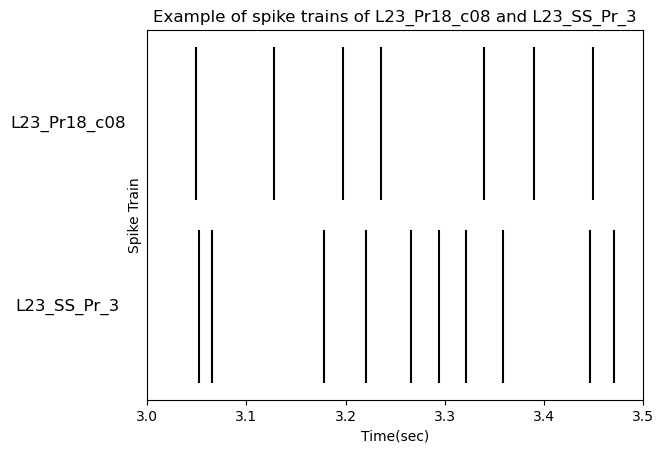

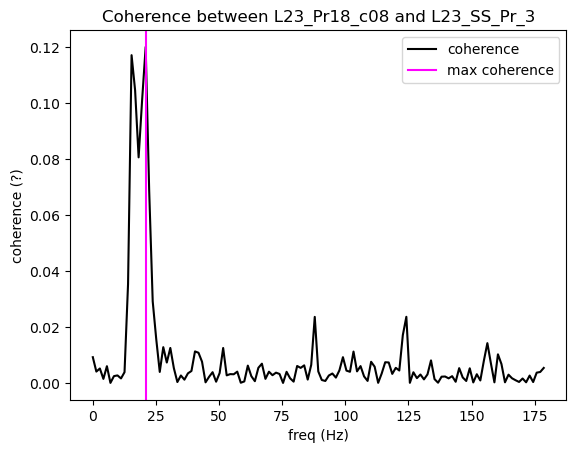

The maximum coherence occur at [20.92633929] Hz


In [105]:
#Fig 2 we do the same for some neurons out-phase syncronization

EEG=data['ActivPark']['L23_EEGipsi']
fs_EEG = 1/(EEG["interval"][0])
ST1=data['ActivPark']['L23_Pr18_c08']
ST2=data["ActivPark"]["L23_SS_Pr_3"]
plt.vlines(ST1["times"][0],-0.40,-0.50,"k")
plt.vlines(ST2["times"][0],-0.52,-0.62,"k")
plt.text(2.92, -0.45, 'L23_Pr18_c08', fontsize=12, ha='center', va='center', color='k')
plt.text(2.92, -0.57, 'L23_SS_Pr_3', fontsize=12, ha='center', va='center', color='k')
plt.yticks([])
plt.xlim(3, 3.5)
plt.xlabel('Time (s)')
plt.ylabel('Spike Train')
plt.title("Example of spike trains of L23_Pr18_c08 and L23_SS_Pr_3")
plt.xlabel("Time(sec)")
plt.savefig("Example of spike trains of L23_Pr18_c08 and L23_SS_Pr_3")
plt.show()

counts1bis, bin_edges1bis = np.histogram(ST1["times"][0], range = [0,100], bins=len(EEG["values"][0]))
counts2bis, bin_edges2bis = np.histogram(ST2["times"][0], range = [0,100], bins=len(EEG["values"][0]))

frequencies, C12bis = scipy.signal.coherence(counts1bis, counts2bis, fs=fs_EEG)
plt.plot(frequencies, C12bis, label="coherence", color="k")

C12bisxmax = frequencies[np.where(C12bis == np.max(C12bis))]
plt.axvline(C12bisxmax, color="magenta", label="max coherence")
plt.title("Coherence between L23_Pr18_c08 and L23_SS_Pr_3")
plt.xlabel("freq (Hz)")                                                               
plt.ylabel("coherence (?)")
plt.legend()
plt.savefig("Coherence between L23_Pr18_c08 and L23_SS_Pr_3")
plt.show()
print("The maximum coherence occur at {} Hz".format(C12bisxmax))  

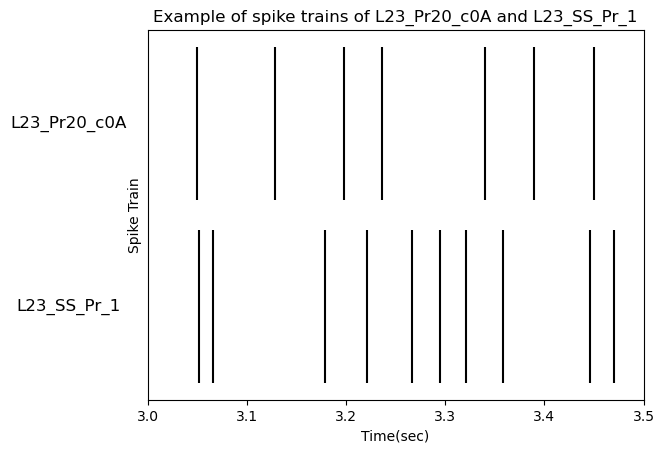

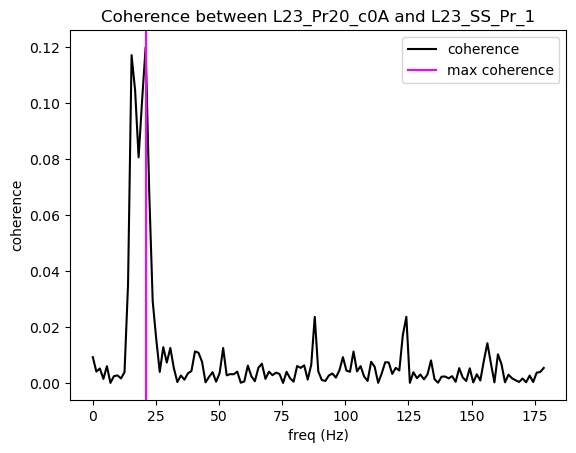

The maximum coherence occur at [20.92633929] Hz


In [109]:
# supplementary data for Fig.2: we do the same for some neurons without syncronization

EEG=data['ActivPark']['L23_EEGipsi']
fs_EEG = 1/(EEG["interval"][0])
ST1=data['ActivPark']['L23_Pr18_c08']
ST2=data["ActivPark"]["L23_SS_Pr_3"]
plt.vlines(ST1["times"][0],-0.40,-0.50,"k")
plt.vlines(ST2["times"][0],-0.52,-0.62,"k")
plt.text(2.92, -0.45, 'L23_Pr20_c0A', fontsize=12, ha='center', va='center', color='k')
plt.text(2.92, -0.57, 'L23_SS_Pr_1', fontsize=12, ha='center', va='center', color='k')
plt.yticks([])
plt.xlim(3, 3.5)
plt.xlabel('Time (s)')
plt.ylabel('Spike Train')
plt.title("Example of spike trains of L23_Pr20_c0A and L23_SS_Pr_1")
plt.xlabel("Time(sec)")
plt.savefig("Example of spike trains of L23_Pr20_c0A and L23_SS_Pr_1")
plt.show()

counts1bis, bin_edges1bis = np.histogram(ST1["times"][0], range = [0,100], bins=len(EEG["values"][0]))
counts2bis, bin_edges2bis = np.histogram(ST2["times"][0], range = [0,100], bins=len(EEG["values"][0]))

frequencies, C12bis = scipy.signal.coherence(counts1bis, counts2bis, fs=fs_EEG)
plt.plot(frequencies, C12bis, label="coherence", color="k")

C12bisxmax = frequencies[np.where(C12bis == np.max(C12bis))]
plt.axvline(C12bisxmax, color="magenta", label="max coherence")
plt.title("Coherence between L23_Pr20_c0A and L23_SS_Pr_1")
plt.xlabel("freq (Hz)")                                                               
plt.ylabel("coherence")
plt.legend()
plt.savefig("Coherence between L23_Pr20_c0A and L23_SS_Pr_1")
plt.show()
print("The maximum coherence occur at {} Hz".format(C12bisxmax))  


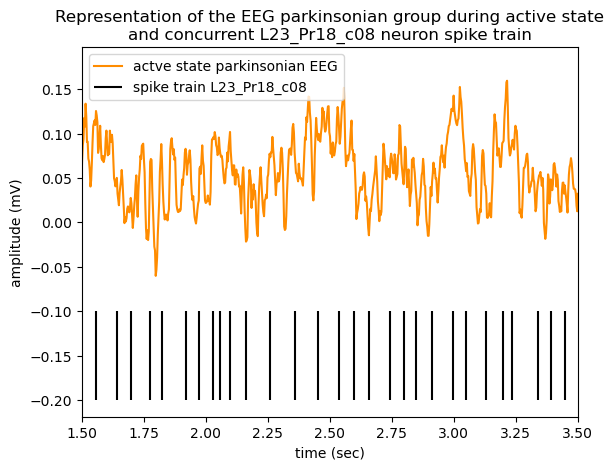

The maximum coherence betwwen ST1 and EEG occur at [16.74107143] Hz


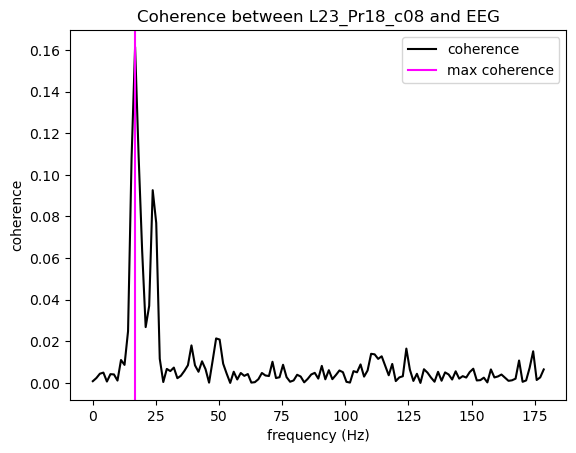

In [123]:
#Fig 2 : we look at the coherence of a neuron with EEG 
# for representation we plot both signals: 

# Look up EEG
EEG=data['ActivPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]
EEG_frequency=1/EEG_interval

duration= len(EEG_data)*EEG_interval
time=np.linspace(0,duration,len(EEG_data))

plt.plot(time[:int(5/EEG_interval)],EEG_data[:int(5/EEG_interval)], label="actve state parkinsonian EEG", color="darkorange");
plt.title("Representation of the EEG parkinsonian group during active state\nand concurrent L23_Pr18_c08 neuron spike train")
plt.xlabel("time (sec)")                                                               
plt.ylabel("amplitude (mV)")

# Look up spike times of 1 neurons 
ST=data['ActivPark']['L23_Pr18_c08']
plt.vlines(ST["times"][0],-0.10,-0.20,"r",label="spike train L23_Pr18_c08", color="k")
plt.xlim(1.5,3.5)
plt.legend(loc='upper left')
plt.savefig("parkinsonian active state EEG and concurent neuron spike train")
plt.show()

#Coherence analysis
frequencies, C1EEG = scipy.signal.coherence(counts1bis, EEG['values'][0], fs=fs_EEG)
plt.plot(frequencies,C1EEG, label="coherence",color="k")

C1EEGxmax=frequencies[np.where(C1EEG == np.max(C1EEG))]

print("The maximum coherence betwwen ST1 and EEG occur at {} Hz".format(C1EEGxmax))
plt.axvline(C1EEGxmax, color="magenta",label="max coherence")
plt.title("Сoherence between L23_Pr18_c08 and EEG")
plt.xlabel("frequency (Hz)")                                                                
plt.ylabel("coherence")
plt.legend()
plt.savefig("coherence betwwen L23_Pr18_c08 and EEG.", format="svg")
plt.show()

# QUESTION 3 : Can we classify neurons acording to their synchronization with EEG during SWA (in parkinsonian and control)?
### Here we propose a classification methods based on the spike-triggered average value at lag 0 and suppose, based on this classification, distinguish different clusters of neurons (clustered base on this spike-triggered average at lag 0 value and mean firing frequency)
 

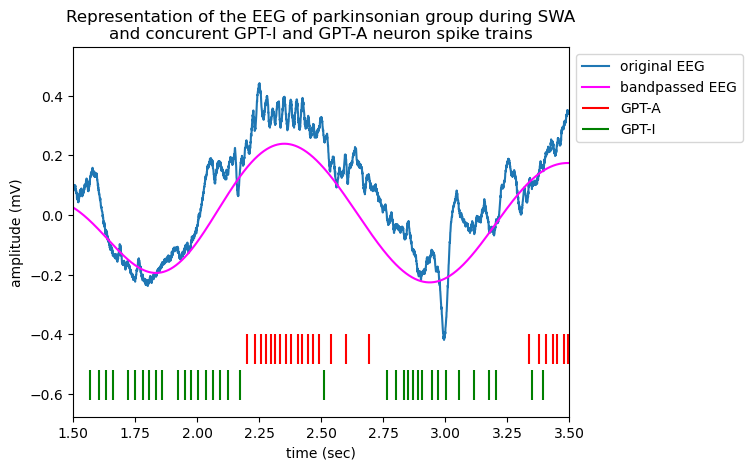

In [129]:
#Figure 3 : For Parkinsonian, we plot the EEG (original and smoothed) during slow wave state and example of neuron firing more during up state or during down state (just for the figure). 
#left

EEG=data['SWAPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]
EEG_frequency=1/EEG_interval

duration= len(EEG_data)*EEG_interval
time=np.linspace(0,duration,len(EEG_data))

fnyq = 0.5 * EEG_frequency
normal_cutoff1 = 1.5 / fnyq
order=5

EEG_data2= bandpass(1.5,0.5,EEG_data,EEG_frequency)

plt.plot(time[:int(5/EEG_interval)],EEG_data[:int(5/EEG_interval)], label="original EEG");
plt.plot(time[:int(5/EEG_interval)],EEG_data2[:int(5/EEG_interval)],label="bandpassed EEG",color="magenta");
plt.title("Representation of the EEG of parkinsonian group during SWA\nand concurent GPT-I and GPT-A neuron spike trains")
plt.xlabel("time (sec)")                                                               
plt.ylabel("amplitude (mV)")


# Look up spike times of 2 neurons during the EEG recording (one GPT-A and one GPT-I actually)
STGPTA=data['SWAPark']['L23_SS_Pr_1']
ST1GPTI=data['SWAPark']["L23_Pr20_c0A"]
plt.vlines(STGPTA["times"][0],-0.40,-0.50,"r",label="GPT-A")
plt.vlines(ST1GPTI["times"][0],-0.52,-0.62,"g",label="GPT-I")
plt.xlim(1.5,3.5)
plt.legend(loc = 'upper left', bbox_to_anchor = (1, 1))
plt.savefig("parkinsonian SWA EEG and concurent GPT-I GPT-A neuron spike train")
plt.show()

1785.7142857142858


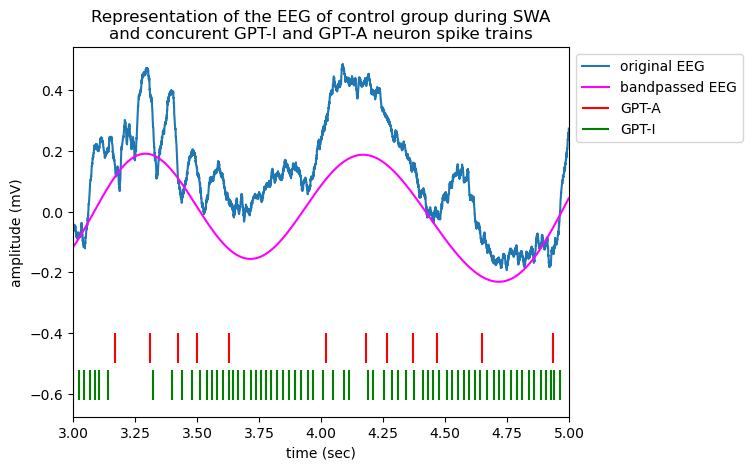

In [131]:
# we do the same for control 
EEG=data['SWACtl']["A9_EEGipsi"]
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]
EEG_frequency=1/EEG_interval
print(1/EEG_interval)

duration= len(EEG_data)*EEG_interval
time=np.linspace(0,duration,len(EEG_data))

fnyq = 0.5 * EEG_frequency
normal_cutoff1 = 1.5 / fnyq
order=5

EEG_data2= bandpass(1.5,0.5,EEG_data,EEG_frequency)

plt.plot(time[:int(5/EEG_interval)],EEG_data[:int(5/EEG_interval)], label="original EEG");
plt.plot(time[:int(5/EEG_interval)],EEG_data2[:int(5/EEG_interval)],label="bandpassed EEG", color="magenta");

plt.title("Representation of the EEG of control group during SWA\nand concurent GPT-I and GPT-A neuron spike trains")
plt.xlabel("time (sec)")                                                               
plt.ylabel("amplitude (mV)")

STGPTA=data['SWACtl']["A9_SS_Pr_4"]
ST1GPTI=data['SWACtl']["A9_SS_Pr_3"]
plt.vlines(STGPTA["times"][0],-0.40,-0.50,"r",label="GPT-A")
plt.vlines(ST1GPTI["times"][0],-0.52,-0.62,"g",label="GPT-I")
plt.xlim(3,5)
plt.legend(loc = 'upper left', bbox_to_anchor = (1, 1))
plt.savefig("Control SWA EEG and concurent GPT-I GPT-A neuron spike train")
plt.show()

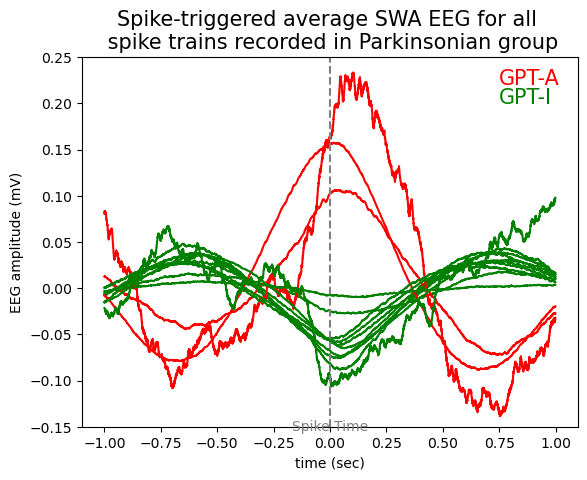

GPT_I ['L23_Pr20_c09', 'L23_Pr20_c0A', 'L23_Pr23_c0E', 'L23_Pr23_c0F', 'L23_Pr25_c10', 'L23_SS_Pr_11', 'L23_SS_Pr_17', 'L23_SS_Pr_21', 'L23_SS_Pr_22', 'L23_SS_Pr_7']
GPT_A ['L23_Pr20_c0B', 'L23_Pr25_c11', 'L23_SS_Pr_1']


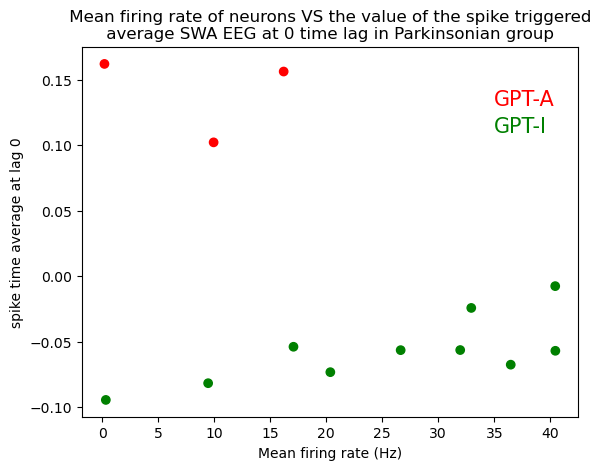

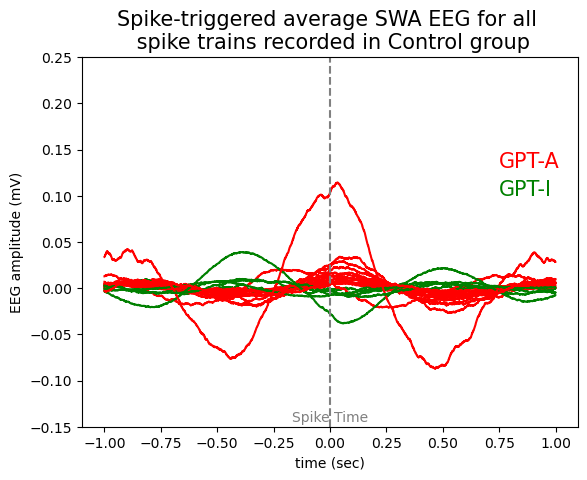

GPT_I ['A9_Pr10_c0E', 'A9_Pr9_c0A', 'A9_SS_Pr_25', 'A9_SS_Pr_3', 'A9_SS_Pr_6']
GPT_A ['A9_P2021_c10', 'A9_P2021_c11', 'A9_Pr10_c0C', 'A9_Pr10_c0D', 'A9_Pr1_c01', 'A9_Pr22_c12', 'A9_Pr22_c13', 'A9_Pr8_c07', 'A9_Pr8_c08', 'A9_Pr9_c09', 'A9_Pr9_c0B', 'A9_SS_Pr_11', 'A9_SS_Pr_2', 'A9_SS_Pr_4', 'A9_SS_Pr_7']


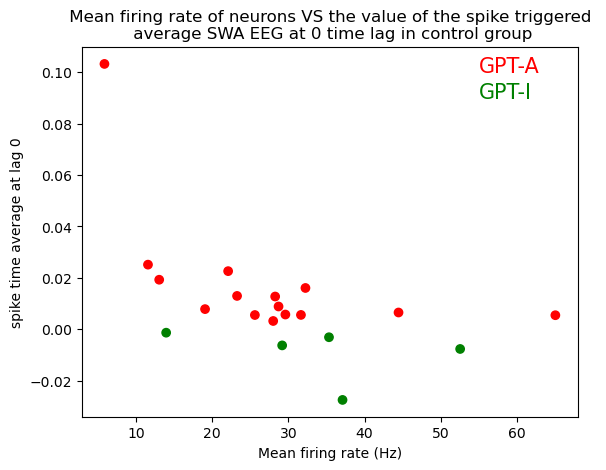

In [157]:
#: Figure 3 : We do the spike train SWA EEG of each neuron
# We plot the spike train average at lag 0 against mean firing of neurons to see if we can observe two clusters.
# We labelled neurons in blue or red acording to if their STA at lag 0 is positive (GPT-A) or negative (GPT-I) to check if it is a good way to classify them

#We do it for Parkinsonian SWA EEG
keys=list(data['SWAPark'].keys())

EEG=data['SWAPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

windowsec=2;
windowint=windowsec/EEG_interval; 
t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval)
STAall=np.zeros(int(windowint))

STA0s={}
for i in keys[1:]:
    STAi=np.zeros(int(windowint))
    STi_times=data['SWAPark'][i]['times'][0]
    j1=np.argmin(np.abs(STi_times-windowsec))
    j2=np.argmin(np.abs(STi_times-(len(EEG_data)*EEG_interval-windowsec)))
    for j in range(j1,j2):
        STAi += EEG_data[int(STi_times[j+1]/EEG_interval)-int(windowint/2)-1:int(STi_times[j+1]/EEG_interval)+int(windowint/2)] #why -1
    STAi=STAi/(len(STi_times)-2) 
    STAi=STAi-np.mean(STAi)
    STA0s[i]=STAi[int(windowint/2)]
    if STAi[int(windowint/2)] > 0:
        color="red"
    else:
        color="green"
    plt.plot(t,STAi,color=color)
plt.title("Spike-triggered average SWA EEG for all \n spike trains recorded in Parkinsonian group", fontsize=15)
plt.xlabel("time (sec)")                                                               
plt.ylabel("EEG amplitude (mV)")
plt.ylim(-0.15,0.25)
plt.axvline(x=0, color='gray', linestyle='--')  # Vertical line at x=0
plt.text(0, -0.15, 'Spike Time', ha='center', va='center', fontsize=10, color='gray')
plt.annotate("GPT-A",xy=(0.75,0.22), color = "red", fontsize=15)
plt.annotate("GPT-I",xy=(0.75,0.20), color = "green", fontsize=15)
plt.savefig("spike-triggered average slow wave EEG for all spike trains recorded in Parkinsonian group")
plt.show()


# sort in GPT-I or GPT-A
GPT_I=[]
GPT_A=[]
for i in STA0s:
    if STA0s[i]<0:
        GPT_I.append(i)
    if STA0s[i]>0:
        GPT_A.append(i)
print("GPT_I",GPT_I)
print("GPT_A",GPT_A)

#compute MFR
MFR={}
for i in keys[1:]:
    STi_times=data['SWAPark'][i]['times'][0]
    MFR_STi= len(STi_times)/np.max(STi_times)
    MFR[i]=MFR_STi                                                   



MFRlist=[]
STA0slist=[]
colors=[]
for key in STA0s.keys():
    if key in MFR:  
        STA0slist.append(STA0s[key])
        MFRlist.append(MFR[key])
        if key in GPT_A:
            colors.append('red') 
        else:
            colors.append("green")

plt.scatter(MFRlist,STA0slist,c=colors)
plt.xlabel("Mean firing rate (Hz)") 
plt.ylabel("spike time average at lag 0")
plt.title(" Mean firing rate of neurons VS the value of the spike triggered \n average SWA EEG at 0 time lag in Parkinsonian group ")
plt.annotate("GPT-A",xy=(35,0.13), color = "red", fontsize=15)
plt.annotate("GPT-I",xy=(35,0.11), color = "green", fontsize=15)
plt.savefig(" Mean firing rate of neurons VS the value of the spike triggered average SWA EEG at 0 time lag in Parkinsonian group ")
plt.show()


# We compare with control SWA EEG
keys=list(data['SWACtl'].keys())


EEG=data['SWACtl']['A9_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

windowsec=2; windowint=windowsec/EEG_interval; 
t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval)
STAall=np.zeros(int(windowint))

STA0s={}
for i in keys[1:]:
    STAi=np.zeros(int(windowint))
    STi_times=data['SWACtl'][i]['times'][0]
    j1=np.argmin(np.abs(STi_times-windowsec))
    j2=np.argmin(np.abs(STi_times-(len(EEG_data)*EEG_interval-windowsec)))
    for j in range(j1,j2):
        STAi += EEG_data[int(STi_times[j+1]/EEG_interval)-int(windowint/2)-1:int(STi_times[j+1]/EEG_interval)+int(windowint/2)] #why -1
    STAi=STAi/(len(STi_times)-2) 
    STAi=STAi-np.mean(STAi)
    STA0s[i]=STAi[int(windowint/2)]
    if STAi[int(windowint/2)] > 0:
        color="red"
    else:
        color="green"
    plt.plot(t,STAi,color=color)
plt.title("Spike-triggered average SWA EEG for all \n spike trains recorded in Control group", fontsize=15)
plt.xlabel("time (sec)")  
plt.ylim(-0.15,0.25)
plt.ylabel("EEG amplitude (mV)")
plt.axvline(x=0, color='gray', linestyle='--')  # Vertical line at x=0
plt.text(0, -0.14, 'Spike Time', ha='center', va='center', fontsize=10, color='gray')
plt.annotate("GPT-A",xy=(0.75,0.13), color = "red", fontsize=15)
plt.annotate("GPT-I",xy=(0.75,0.10), color = "green", fontsize=15)
plt.savefig("Spike-triggered average SWA EEG for all spike trains recorded in Control group")
plt.show()

# sort in GPT-I or GPT-A
GPT_I=[]
GPT_A=[]
for i in STA0s:
    if STA0s[i]<0:
        GPT_I.append(i)
    if STA0s[i]>0:
        GPT_A.append(i)
print("GPT_I",GPT_I)
print("GPT_A",GPT_A)

#compute MFR
MFR={}
for i in keys[1:]:
    STi_times=data['SWACtl'][i]['times'][0]
    MFR_STi= len(STi_times)/np.max(STi_times)
    MFR[i]=MFR_STi                                                     


MFRlist=[]
STA0slist=[]
colors=[]
for key in STA0s.keys():
    if key in MFR:  # Ensure the key exists in both dictionaries
        STA0slist.append(STA0s[key])
        MFRlist.append(MFR[key])
        if key in GPT_A:
            colors.append('red') 
        else:
            colors.append("green")


plt.scatter(MFRlist,STA0slist,c=colors)
plt.xlabel("Mean firing rate (Hz)") 
plt.ylabel("spike time average at lag 0")
plt.title(" Mean firing rate of neurons VS the value of the spike triggered \n average SWA EEG at 0 time lag in control group")
plt.annotate("GPT-A",xy=(55,0.10), color = "red", fontsize=15)
plt.annotate("GPT-I",xy=(55,0.09), color = "green", fontsize=15)
plt.savefig(" Mean firing rate of neurons VS the value of the spike triggered average SWA EEG at 0 time lag in control group")
plt.show()


# Additional code that is a liiiittle bit dirty but that we want to keep for aditional slides for pesentation 
# : )

## to test whether the neurons identified as GPT-A / GPT-I neurons during SWA state also fire in a preferred phase of EEG during active state.

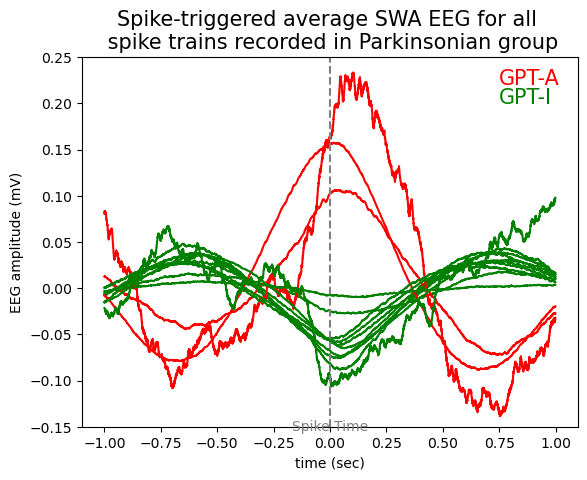

GPT_I ['L23_Pr20_c09', 'L23_Pr20_c0A', 'L23_Pr23_c0E', 'L23_Pr23_c0F', 'L23_Pr25_c10', 'L23_SS_Pr_11', 'L23_SS_Pr_17', 'L23_SS_Pr_21', 'L23_SS_Pr_22', 'L23_SS_Pr_7']
GPT_A ['L23_Pr20_c0B', 'L23_Pr25_c11', 'L23_SS_Pr_1']


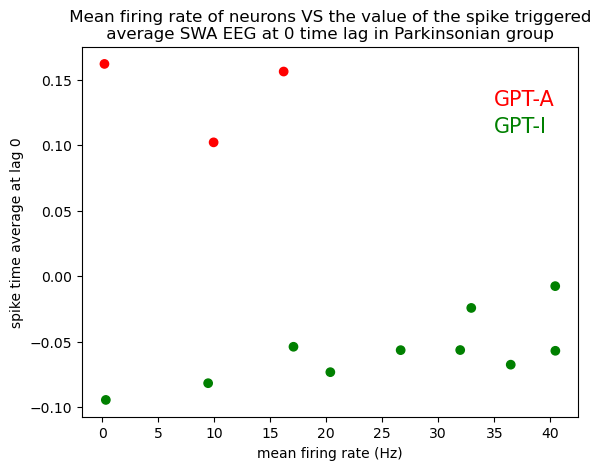

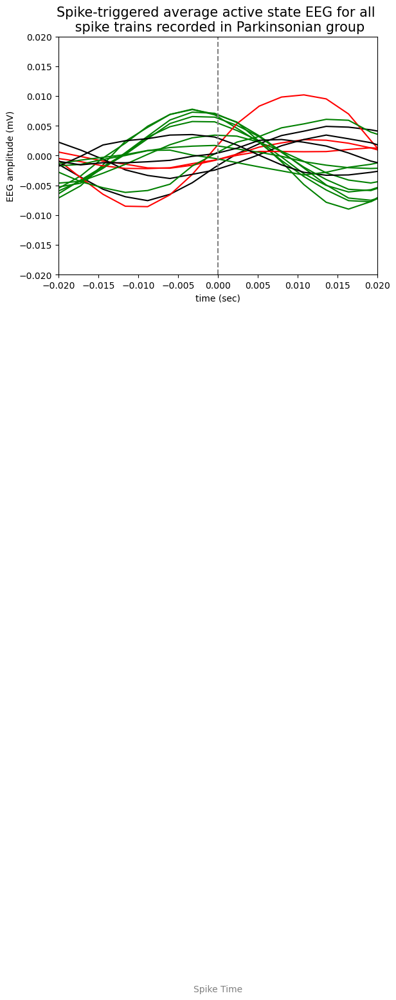

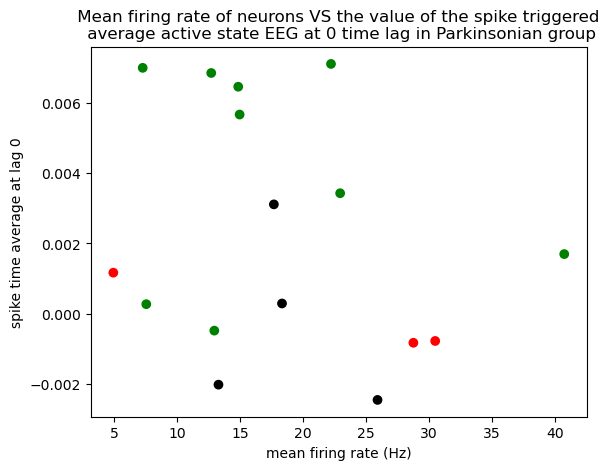

In [159]:
# We do the spike train EEG of each neuron in parkinsonian group during SWA and active state
# We labelled neurons in green or red according to if their STA at lag 0 is positive (GPT-A) or negative (GPT-I) to check if it is a good way to classify them
# We plot the spike train average at lag 0 against mean firing of neurons in parkinsonian *active state* with the same labelling (according to two groups) to observe if there is a difference in their firing patterns in these state and can we observe again two clusters 

#We do it for Parkinsonian SWA EEG
keys=list(data['SWAPark'].keys())
EEG=data['SWAPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

windowsec=2;
windowint=windowsec/EEG_interval; 
t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval)
STAall=np.zeros(int(windowint))

STA0s={}
for i in keys[1:]:
    STAi=np.zeros(int(windowint))
    STi_times=data['SWAPark'][i]['times'][0]
    j1=np.argmin(np.abs(STi_times-windowsec))
    j2=np.argmin(np.abs(STi_times-(len(EEG_data)*EEG_interval-windowsec)))
    for j in range(j1,j2):
        STAi += EEG_data[int(STi_times[j+1]/EEG_interval)-int(windowint/2)-1:int(STi_times[j+1]/EEG_interval)+int(windowint/2)] #why -1
    STAi=STAi/(len(STi_times)-2) 
    STAi=STAi-np.mean(STAi)
    STA0s[i]=STAi[int(windowint/2)]
    if STAi[int(windowint/2)] > 0:
        color="red"
    else:
        color="green"
    plt.plot(t,STAi,color=color)
plt.title("Spike-triggered average SWA EEG for all \n spike trains recorded in Parkinsonian group", fontsize=15)
plt.xlabel("time (sec)")                                                               
plt.ylabel("EEG amplitude (mV)")
plt.ylim(-0.15,0.25)
plt.axvline(x=0, color='gray', linestyle='--')  # Vertical line at x=0
plt.text(0, -0.15, 'Spike Time', ha='center', va='center', fontsize=10, color='gray')
plt.annotate("GPT-A",xy=(0.75,0.22), color = "red", fontsize=15)
plt.annotate("GPT-I",xy=(0.75,0.20), color = "green", fontsize=15)
plt.show()

# sort in GPT-I or GPT-A
GPT_I=[]
GPT_A=[]
for i in STA0s:
    if STA0s[i]<0:
        GPT_I.append(i)
    if STA0s[i]>0:
        GPT_A.append(i)
print("GPT_I",GPT_I)
print("GPT_A",GPT_A)

#compute MFR
MFR={}
for i in keys[1:]:
    STi_times=data['SWAPark'][i]['times'][0]
    MFR_STi= len(STi_times)/np.max(STi_times)
    MFR[i]=MFR_STi                                                   

MFRlist=[]
STA0slist=[]
colors=[]
for key in STA0s.keys():
    if key in MFR:  
        STA0slist.append(STA0s[key])
        MFRlist.append(MFR[key])
        if key in GPT_A:
            colors.append('red') 
        else:
            colors.append("green")

plt.scatter(MFRlist,STA0slist,c=colors)
plt.xlabel("mean firing rate (Hz)") 
plt.ylabel("spike time average at lag 0")
plt.title(" Mean firing rate of neurons VS the value of the spike triggered \n average SWA EEG at 0 time lag in Parkinsonian group ")
plt.annotate("GPT-A",xy=(35,0.13), color = "red", fontsize=15)
plt.annotate("GPT-I",xy=(35,0.11), color = "green", fontsize=15)
plt.show()







# We compare with control active state EEG
keys=list(data['ActivPark'].keys())

EEG=data['ActivPark']['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0]

windowsec=2; windowint=windowsec/EEG_interval; 
t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval)
STAall=np.zeros(int(windowint))

STA0s={}
for i in keys[3:]:
    STAi=np.zeros(int(windowint))
    STi_times=data['ActivPark'][i]['times'][0]
    j1=np.argmin(np.abs(STi_times-windowsec))
    j2=np.argmin(np.abs(STi_times-(len(EEG_data)*EEG_interval-windowsec)))
    for j in range(j1,j2):
        STAi += EEG_data[int(STi_times[j+1]/EEG_interval)-int(windowint/2):int(STi_times[j+1]/EEG_interval)+int(windowint/2)]
    STAi=STAi/(len(STi_times)-2) 
    STAi=STAi-np.mean(STAi)
    STA0s[i]=STAi[int(windowint/2)]
    if i in GPT_A:
        color="red"
    elif i in GPT_I:
        color="green"
    else:
        color="k"
    plt.plot(t,STAi,color=color)
plt.title("Spike-triggered average active state EEG for all \n spike trains recorded in Parkinsonian group", fontsize=15)
plt.xlabel("time (sec)")  
plt.xlim(-0.02,0.02)
plt.ylim(-0.02,0.02)
plt.ylabel("EEG amplitude (mV)")
plt.axvline(x=0, color='gray', linestyle='--')  # Vertical line at x=0
plt.text(0, -0.14, 'Spike Time', ha='center', va='center', fontsize=10, color='gray')
plt.annotate("GPT-A",xy=(0.75,0.13), color = "red", fontsize=15)
plt.annotate("GPT-I",xy=(0.75,0.10), color = "green", fontsize=15)
plt.show()

#compute MFR
MFR={}
for i in keys[3:]:
    STi_times=data['ActivPark'][i]['times'][0]
    MFR_STi= len(STi_times)/np.max(STi_times)
    MFR[i]=MFR_STi                                                     

MFRlist=[]
STA0slist=[]
colors=[]
for key in STA0s.keys():
    if key in MFR:  # Ensure the key exists in both dictionaries
        STA0slist.append(STA0s[key])
        MFRlist.append(MFR[key])
        if key in GPT_A:
            colors.append("red")
        elif key in GPT_I:
            colors.append("green")
        else:
            colors.append("k")


plt.scatter(MFRlist,STA0slist,c=colors)
plt.xlabel("mean firing rate (Hz)") 
plt.ylabel("spike time average at lag 0")
plt.title(" Mean firing rate of neurons VS the value of the spike triggered \n average active state EEG at 0 time lag in Parkinsonian group")
plt.annotate("GPT-A",xy=(55,0.10), color = "red", fontsize=15)
plt.annotate("GPT-I",xy=(55,0.09), color = "green", fontsize=15)
plt.show()

## neurons preferred firing phase during active state

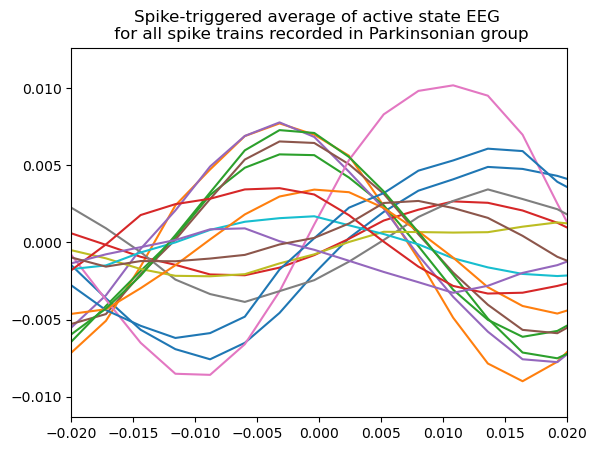

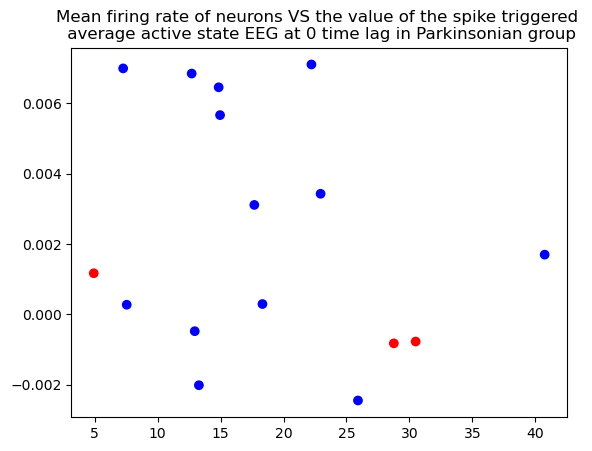

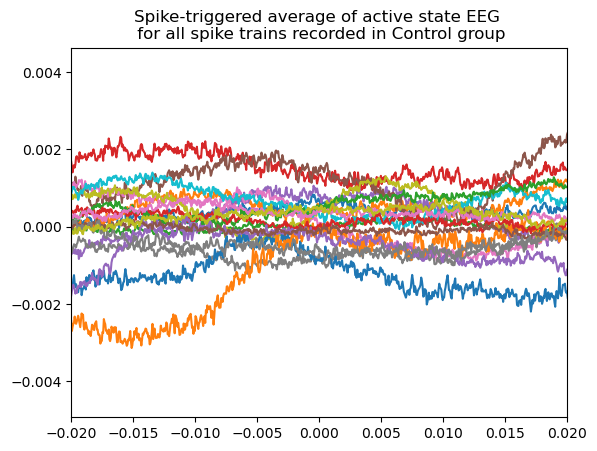

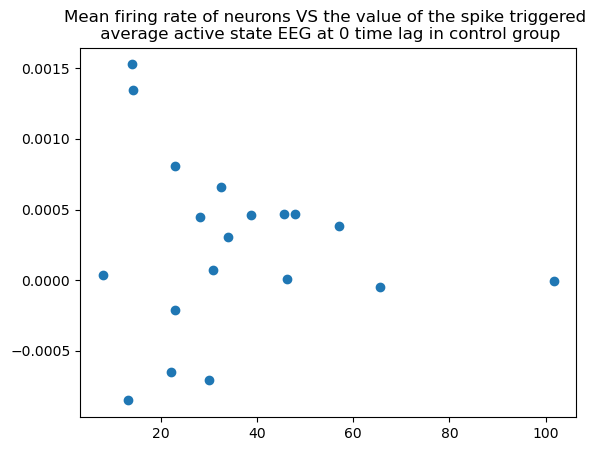

In [155]:
#additional : MFR / STA0s durinc active state
keys=list(data['ActivPark'].keys())

EEG=data["ActivPark"]['L23_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0] 

windowsec=2;
windowint=windowsec/EEG_interval; 
t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval)
STAall=np.zeros(int(windowint))

STA0s={}
for i in keys[3:]:
    STAi=np.zeros(int(windowint))
    STi_times=data['ActivPark'][i]['times'][0]
    j1=np.argmin(np.abs(STi_times-windowsec))
    j2=np.argmin(np.abs(STi_times-(len(EEG_data)*EEG_interval-windowsec)))
    for j in range(j1,j2):
        STAi += EEG_data[int(STi_times[j+1]/EEG_interval)-int(windowint/2):int(STi_times[j+1]/EEG_interval)+int(windowint/2)] #why -1
    STAi=STAi/(len(STi_times)-2) 
    STAi=STAi-np.mean(STAi)
    STA0s[i]=STAi[int(windowint/2)]
    plt.plot(t,STAi)
    plt.xlim(-0.02,0.02)
plt.title("Spike-triggered average of active state EEG \n for all spike trains recorded in Parkinsonian group")
plt.show()

MFR={}
for i in keys[3:]:
    STi_times=data["ActivPark"][i]['times'][0]
    MFR_STi= len(STi_times)/np.max(STi_times)
    MFR[i]=MFR_STi                                                     

MFRlist=[]
STA0slist=[]
colors=[]

for key in STA0s.keys():
    if key in MFR:  # Ensure the key exists in both dictionaries
        STA0slist.append(STA0s[key])
        MFRlist.append(MFR[key])
        if key in GPT_A:
            colors.append('red') 
        else:
            colors.append('blue')
plt.scatter(MFRlist,STA0slist,c=colors)
plt.title("Mean firing rate of neurons VS the value of the spike triggered \n average active state EEG at 0 time lag in Parkinsonian group")
plt.show()

##compare with ctl activated state
keys=list(data['ActivCtl'].keys())

EEG=data["ActivCtl"]['A9_EEGipsi']
EEG_data=EEG['values'][0]
EEG_interval=EEG['interval'][0][0] 

windowsec=2;
windowint=windowsec/EEG_interval; 
t=np.arange(-windowsec/2,windowsec/2-EEG_interval,EEG_interval)
STAall=np.zeros(int(windowint))

STA0s={}
for i in keys[1:]:
    STAi=np.zeros(int(windowint))
    STi_times=data['ActivCtl'][i]['times'][0]
    j1=np.argmin(np.abs(STi_times-windowsec))
    j2=np.argmin(np.abs(STi_times-(len(EEG_data)*EEG_interval-windowsec)))
    for j in range(j1,j2):
        STAi += EEG_data[int(STi_times[j+1]/EEG_interval)-int(windowint/2):int(STi_times[j+1]/EEG_interval)+int(windowint/2)] #why -1
    STAi=STAi/(len(STi_times)-2) 
    STAi=STAi-np.mean(STAi)
    STA0s[i]=STAi[int(windowint/2)]
    plt.plot(t,STAi)
    plt.xlim(-0.02,0.02)
plt.title("Spike-triggered average of active state EEG \n for all spike trains recorded in Control group")
plt.show()

MFR={}
for i in keys[1:]:
    STi_times=data["ActivCtl"][i]['times'][0]
    MFR_STi= len(STi_times)/np.max(STi_times)
    MFR[i]=MFR_STi                                                     

MFRlist=[]
STA0slist=[]
for key in STA0s.keys():
    if key in MFR:  # Ensure the key exists in both dictionaries
        STA0slist.append(STA0s[key])
        MFRlist.append(MFR[key])
plt.scatter(MFRlist,STA0slist)
plt.title("Mean firing rate of neurons VS the value of the spike triggered \n average active state EEG at 0 time lag in control group")
plt.show()

# THE END
## Thank you from Tim and Olga :)